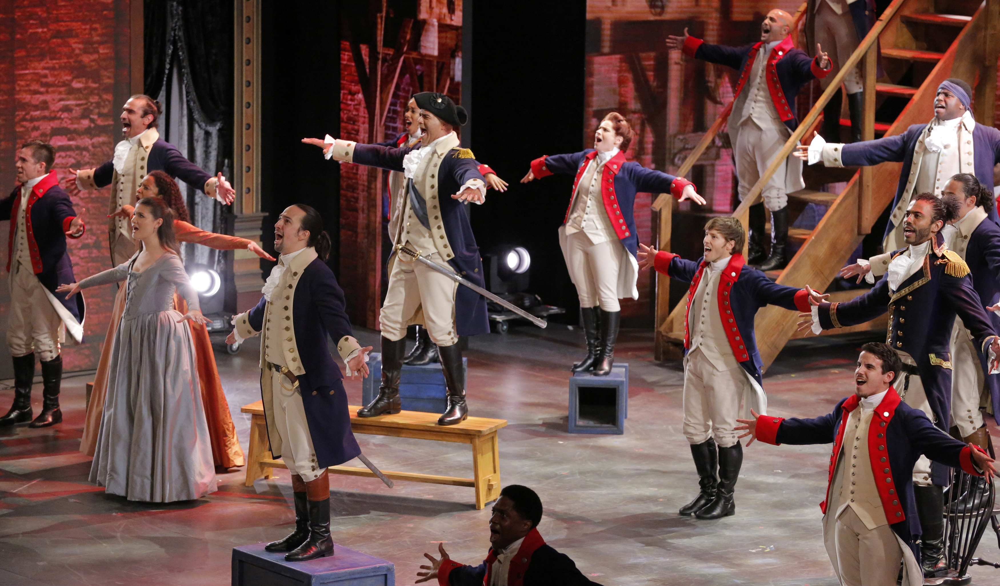
This notebook involves answering some `Research Questions` from data extraction and understanding the profitable policy for stakeholders. This understanding will be used to forecast using the time series prediction models


In [1]:
import pandas as pd 
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from seaborn import set_style
set_style('whitegrid')
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller, kpss, acf, grangercausalitytests
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf,month_plot,quarter_plot
from scipy import signal
import warnings
warnings.filterwarnings('ignore')
import statsmodels.api as sm
plt.rcParams['figure.figsize'] = (15, 10)

In [2]:
gross_data = pd.read_csv('https://raw.githubusercontent.com/tacookson/data/master/broadway-grosses/grosses.csv',parse_dates = ['week_ending'])
show_data = pd.read_csv('https://raw.githubusercontent.com/PSha98/Erdos-2022-project/main/Data_collection/show_info_1985-2019.csv')
CPI_data = pd.read_csv('https://raw.githubusercontent.com/PSha98/Erdos-2022-project/main/Data_collection/CPI_USBLS.csv', parse_dates = ['DATE'])

In [3]:
CPI_data = pd.read_csv('https://raw.githubusercontent.com/PSha98/Erdos-2022-project/main/Data_collection/CPI_USBLS.csv', parse_dates = ['DATE'])
CPI_data.rename(columns = {'CWSR0000SA0':'CPI'}, inplace = True)
gross_data['year'] = gross_data['week_ending'].dt.year
gross_data['month_c'] = [d.strftime('%b') for d in gross_data.week_ending]
gross_data['month'] = gross_data['week_ending'].dt.month
CPI_data['year'] = CPI_data['DATE'].dt.year
CPI_data['month']= CPI_data['DATE'].dt.month
gross_data

,week_ending,week_number,weekly_gross_overall,show,theatre,weekly_gross,potential_gross,avg_ticket_price,top_ticket_price,seats_sold,seats_in_theatre,pct_capacity,performances,previews,year,month_c,month
0,1985-06-09,1,3915937.00,42nd Street,St. James Theatre,282368.00,NaN,30.42,NaN,9281,1655,0.7010,8,0,1985,Jun,6
1,1985-06-09,1,3915937.00,A Chorus Line,Sam S. Shubert Theatre,222584.00,NaN,27.25,NaN,8167,1472,0.6935,8,0,1985,Jun,6
2,1985-06-09,1,3915937.00,Aren't We All?,Brooks Atkinson Theatre,249272.00,NaN,33.75,NaN,7386,1088,0.8486,8,0,1985,Jun,6
3,1985-06-09,1,3915937.00,Arms and the Man,Circle in the Square Theatre,95688.00,NaN,20.87,NaN,4586,682,0.8405,8,0,1985,Jun,6
4,1985-06-09,1,3915937.00,As Is,Lyceum Theatre,61059.00,NaN,20.78,NaN,2938,684,0.5369,8,0,1985,Jun,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47519,2020-03-01,40,26109896.25,The Phantom of the Opera,Majestic Theatre,639215.93,1358986.0,72.18,213.0,8856,1605,0.6897,8,0,2020,Mar,3
47520,2020-03-01,40,26109896.25,Tina: The Tina Turner Musical,Lunt-Fontanne Theatre,1320766.00,1566688.0,132.02,297.0,10004,1478,0.8461,8,0,2020,Mar,3
47521,2020-03-01,40,26109896.25,To Kill A Mockingbird,Sam S. Shubert Theatre,1132278.54,1549625.0,115.41,423.0,9811,1435,0.9767,7,0,2020,Mar,3
47522,2020-03-01,40,26109896.25,West Side Story,Broadway Theatre,1598947.32,1722464.0,114.87,373.0,13920,1740,1.0000,8,0,2020,Mar,3


In [4]:
CPI_data['CPI'] = CPI_data.iloc[-1]['CPI']/CPI_data['CPI']
CPI_data

,DATE,CPI,year,month
0,1947-01-01,13.148889,1947,1
1,1947-02-01,13.064213,1947,2
2,1947-03-01,12.839783,1947,3
3,1947-04-01,12.839783,1947,4
4,1947-05-01,12.863043,1947,5
...,...,...,...,...
899,2021-12-01,1.031327,2021,12
900,2022-01-01,1.024507,2022,1
901,2022-02-01,1.015750,2022,2
902,2022-03-01,1.001908,2022,3


In [5]:
CPI_data2 = CPI_data[['CPI','month','year']]
gross_data2 = gross_data.merge(CPI_data2, how = 'left', on = ['month', 'year'])
gross_data['weekly_gross_overall'] = gross_data2['weekly_gross_overall']*gross_data2['CPI']
gross_data['weekly_gross'] = gross_data2['weekly_gross']*gross_data2['CPI']
gross_data['avg_ticket_price'] = gross_data2['avg_ticket_price']*gross_data2['CPI']
gross_data['potential_gross'] = gross_data2['potential_gross']*gross_data2['CPI']
gross_data['top_ticket_price']= gross_data2['top_ticket_price']*gross_data2['CPI']
gross_data['year']=gross_data.year.astype(int).astype(str)
gross_data

,week_ending,week_number,weekly_gross_overall,show,theatre,weekly_gross,potential_gross,avg_ticket_price,top_ticket_price,seats_sold,seats_in_theatre,pct_capacity,performances,previews,year,month_c,month
0,1985-06-09,1,1.040401e+07,42nd Street,St. James Theatre,7.502061e+05,NaN,80.821017,NaN,9281,1655,0.7010,8,0,1985,Jun,6
1,1985-06-09,1,1.040401e+07,A Chorus Line,Sam S. Shubert Theatre,5.913697e+05,NaN,72.398840,NaN,8167,1472,0.6935,8,0,1985,Jun,6
2,1985-06-09,1,1.040401e+07,Aren't We All?,Brooks Atkinson Theatre,6.622754e+05,NaN,89.668288,NaN,7386,1088,0.8486,8,0,1985,Jun,6
3,1985-06-09,1,1.040401e+07,Arms and the Man,Circle in the Square Theatre,2.542275e+05,NaN,55.448213,NaN,4586,682,0.8405,8,0,1985,Jun,6
4,1985-06-09,1,1.040401e+07,As Is,Lyceum Theatre,1.622239e+05,NaN,55.209097,NaN,2938,684,0.5369,8,0,1985,Jun,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47519,2020-03-01,40,2.949006e+07,The Phantom of the Opera,Majestic Theatre,7.219681e+05,1.534919e+06,81.524345,240.574751,8856,1605,0.6897,8,0,2020,Mar,3
47520,2020-03-01,40,2.949006e+07,Tina: The Tina Turner Musical,Lunt-Fontanne Theatre,1.491751e+06,1.769510e+06,149.111167,335.449300,10004,1478,0.8461,8,0,2020,Mar,3
47521,2020-03-01,40,2.949006e+07,To Kill A Mockingbird,Sam S. Shubert Theatre,1.278862e+06,1.750238e+06,130.350854,477.761125,9811,1435,0.9767,7,0,2020,Mar,3
47522,2020-03-01,40,2.949006e+07,West Side Story,Broadway Theatre,1.805945e+06,1.945452e+06,129.740947,421.288179,13920,1740,1.0000,8,0,2020,Mar,3


### Which show has highest weekly gross overall?


In [6]:
nc,vc=[],[]
gross_data['show'].value_counts()
for i in gross_data['show'].value_counts().index:
    nc.append(i)
    vc.append(gross_data[gross_data['show']==i].weekly_gross_overall.sum())
    #print(i,gross_data[gross_data['show']==i].weekly_gross_overall.sum())
show_gross = pd.DataFrame({'Show_name':nc,'Gross':vc})
show_gross.sort_values(by='Gross',ascending=False)


,Show_name,Gross
0,The Phantom of the Opera,3.815936e+10
1,Chicago,3.219823e+10
2,The Lion King,3.129438e+10
5,Wicked,2.492642e+10
3,Les Miserables,1.915208e+10
...,...,...
1111,"Men Are from Mars, Women Are from Venus",1.434698e+07
1115,Raffi,1.400999e+07
1118,Broadway,1.225468e+07
1119,Senator Joe,1.116221e+07


`Phantom of the Opera` has earned the great attraction from the people. Trying to understand more on this
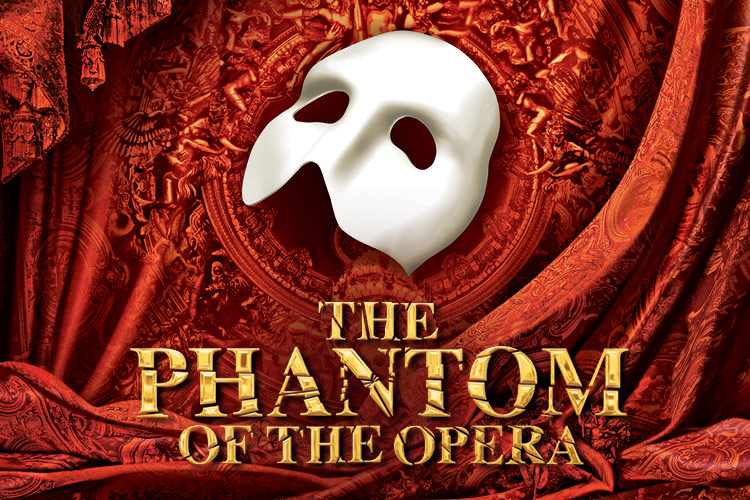

In [7]:
gross_data[gross_data['show']=='The Phantom of the Opera']

,week_ending,week_number,weekly_gross_overall,show,theatre,weekly_gross,potential_gross,avg_ticket_price,top_ticket_price,seats_sold,seats_in_theatre,pct_capacity,performances,previews,year,month_c,month
2718,1988-01-10,32,1.086062e+07,The Phantom of the Opera,Majestic Theatre,1.765282e+05,NaN,111.377852,NaN,1585,1609,0.9851,0,1,1988,Jan,1
2737,1988-01-17,33,1.170789e+07,The Phantom of the Opera,Majestic Theatre,1.116376e+06,NaN,100.482731,NaN,11109,1609,0.9863,0,7,1988,Jan,1
2756,1988-01-24,34,1.090169e+07,The Phantom of the Opera,Majestic Theatre,1.077847e+06,NaN,98.675132,NaN,10924,1609,0.9699,0,7,1988,Jan,1
2775,1988-01-31,35,1.104168e+07,The Phantom of the Opera,Majestic Theatre,1.152521e+06,NaN,95.456119,NaN,12075,1609,0.9381,7,1,1988,Jan,1
2793,1988-02-07,36,9.782698e+06,The Phantom of the Opera,Majestic Theatre,1.196417e+06,NaN,91.359716,NaN,13094,1609,1.0172,8,0,1988,Feb,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47412,2020-02-02,36,2.930169e+07,The Phantom of the Opera,Majestic Theatre,8.341990e+05,1.529439e+06,84.204408,239.715838,9907,1605,0.7716,8,0,2020,Feb,2
47438,2020-02-09,37,3.035429e+07,The Phantom of the Opera,Majestic Theatre,8.262196e+05,1.529439e+06,82.336200,239.715838,10035,1605,0.7815,8,0,2020,Feb,2
47465,2020-02-16,38,3.505991e+07,The Phantom of the Opera,Majestic Theatre,1.093842e+06,1.545274e+06,103.527981,277.980338,10566,1605,0.8229,8,0,2020,Feb,2
47491,2020-02-23,39,3.285785e+07,The Phantom of the Opera,Majestic Theatre,9.457381e+05,1.529439e+06,88.492283,277.980338,10687,1605,0.8323,8,0,2020,Feb,2


Text(0.5, 1.0, 'Weekly gross overall for The Phantom of the Opera')

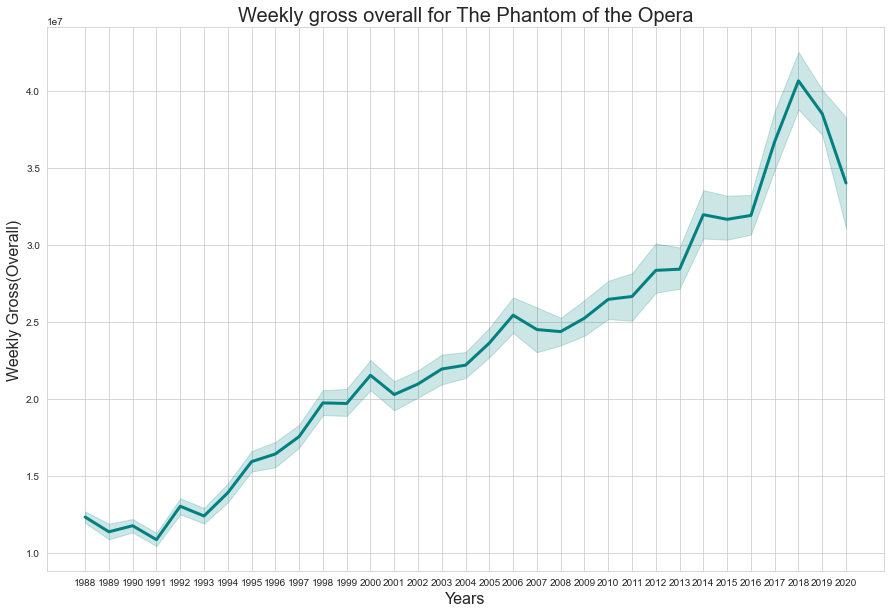

In [8]:
sns.lineplot(x=gross_data[gross_data['show']=='The Phantom of the Opera']['year'],y=gross_data[gross_data['show']=='The Phantom of the Opera']['weekly_gross_overall'],color="teal",linewidth="3")
plt.xlabel('Years',fontsize=16)
plt.ylabel('Weekly Gross(Overall)',fontsize=16)
plt.title('Weekly gross overall for The Phantom of the Opera',fontsize=20)

Text(0.5, 1.0, 'Average ticket price of The Phantom of the Opera')

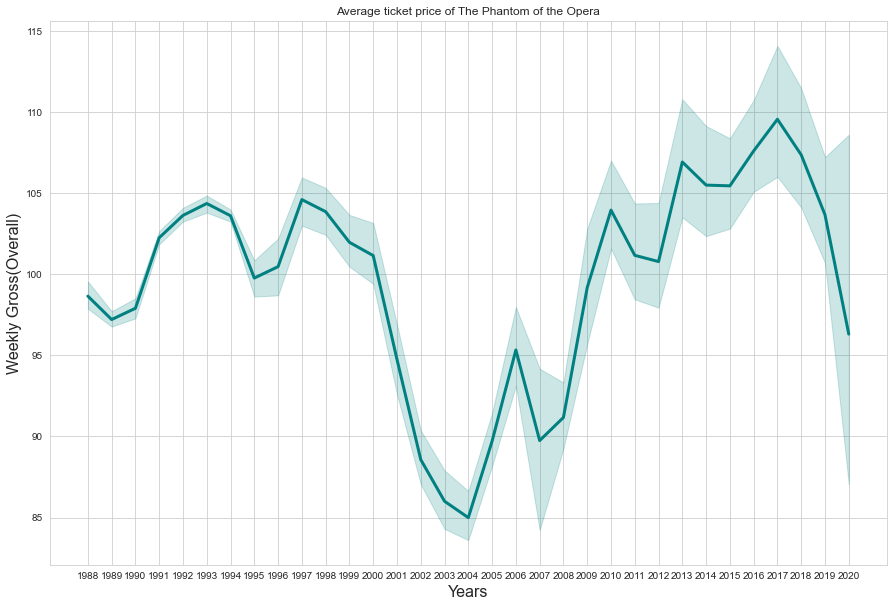

In [9]:
## Average Ticket Price of the the show The Phantom of the Opera
sns.lineplot(x=gross_data[gross_data['show']=='The Phantom of the Opera']['year'],y=gross_data[gross_data['show']=='The Phantom of the Opera']['avg_ticket_price'],color="teal",linewidth="3")
plt.xlabel('Years',fontsize=16)
plt.ylabel('Weekly Gross(Overall)',fontsize=16)
plt.title('Average ticket price of The Phantom of the Opera')

<AxesSubplot:xlabel='year', ylabel='pct_capacity'>

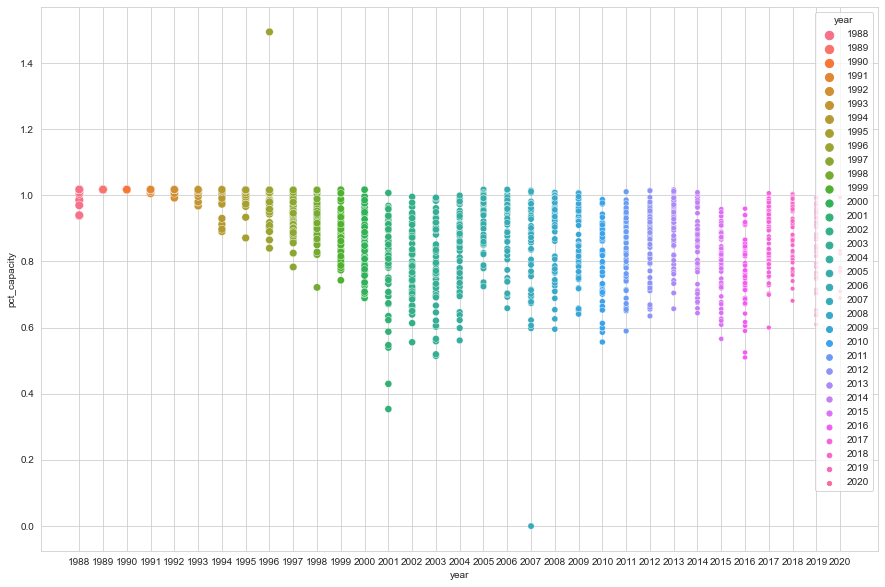

In [10]:
## %Capacity of the Phantom of the Opera every year
sns.scatterplot(data=gross_data[gross_data['show']=='The Phantom of the Opera'],x='year',y='pct_capacity',hue='year',size='year')

(A) The average ticket price does not much affects the percentage capacity of the show.
There might be two type of audience from the above point
1. The ticket price is in the ambits of afforadability of people.
2. The interested audience is wealthy in nature

<AxesSubplot:xlabel='pct_capacity', ylabel='avg_ticket_price'>

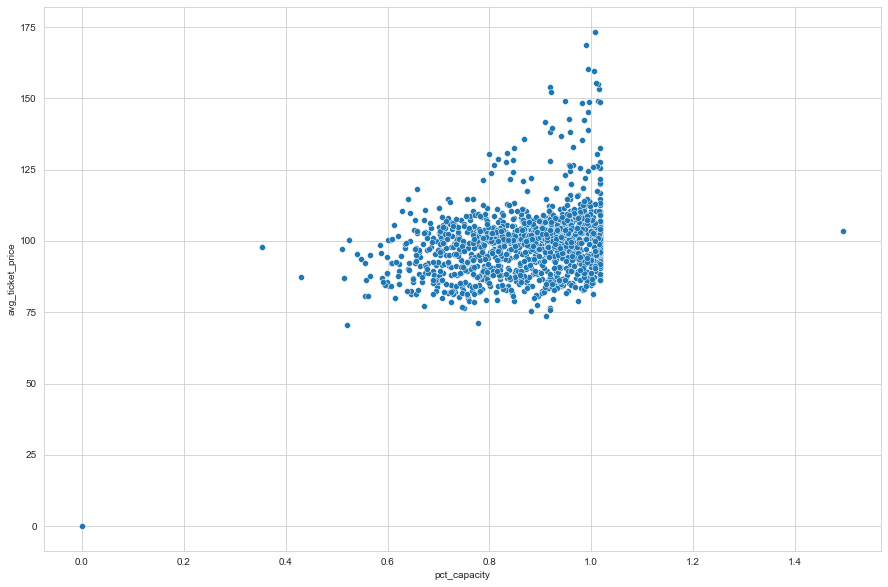

In [11]:
## %Capacity v/s Average Ticket price
sns.scatterplot(data=gross_data[gross_data['show']=='The Phantom of the Opera'],x='pct_capacity',y='avg_ticket_price')

It came out that there is indeed some degree of correlation and  majority of the population beared the ticket price between 75USD to 120USD. 

In [12]:
gross_data[gross_data['show']=='The Phantom of the Opera']['avg_ticket_price'].describe()

count    1677.000000
mean       99.697584
std        11.084352
min         0.000000
25%        94.294908
50%       100.566496
75%       104.159472
max       173.295749
Name: avg_ticket_price, dtype: float64

In [14]:
df = gross_data[gross_data['show']=='The Phantom of the Opera']

df1 = len(df.loc[(df['avg_ticket_price']>=75) & (df['avg_ticket_price']<=120)])/len(df['avg_ticket_price'])
df1

0.9636255217650567

In [15]:
gross_data['avg_ticket_price'].mean()<gross_data[gross_data['show']=='The Phantom of the Opera']['avg_ticket_price'].mean()

True

It is indeed the interest of the show which led the audience to purchase tickets of the show `The Phantom of the Opera` whose average ticket price is greater than the average ticket price of the entire broadway data.  
However, from the audience purchasing the ticket, 96.3% of the population is also price conscious and satisfied to afford the ticket within the range of 75USD to 120USD. The rest 3.7% of the population is not price conscious and solely interest driven.

The next concern takes us to the theatre of `The Phantom of the Opera`

### Which theatre has the highest sum of overall weekly gross?

In [16]:
name,val=[],[]
gross_data['theatre'].value_counts()
for i in gross_data['theatre'].value_counts().index:
    name.append(i)
    val.append(gross_data[gross_data['theatre']==i].weekly_gross_overall.sum())
theater_gross = pd.DataFrame({'Name':name,'overall_gross':val})
theater_gross.sort_values(by='overall_gross',ascending=False)

,Name,overall_gross
0,Broadhurst Theatre,4.326617e+10
1,Minskoff Theatre,4.061137e+10
4,Ambassador Theatre,3.905515e+10
2,Majestic Theatre,3.815936e+10
5,Gershwin Theatre,3.494116e+10
3,Imperial Theatre,3.472156e+10
7,Lunt-Fontanne Theatre,3.430653e+10
6,Eugene O'Neill Theatre,3.381099e+10
8,St. James Theatre,3.134002e+10
13,Richard Rodgers Theatre,3.022993e+10


It turns out that the most theatre which earns the most profit is not `Majestic Theatre` but the `Broadhurst Theatre`
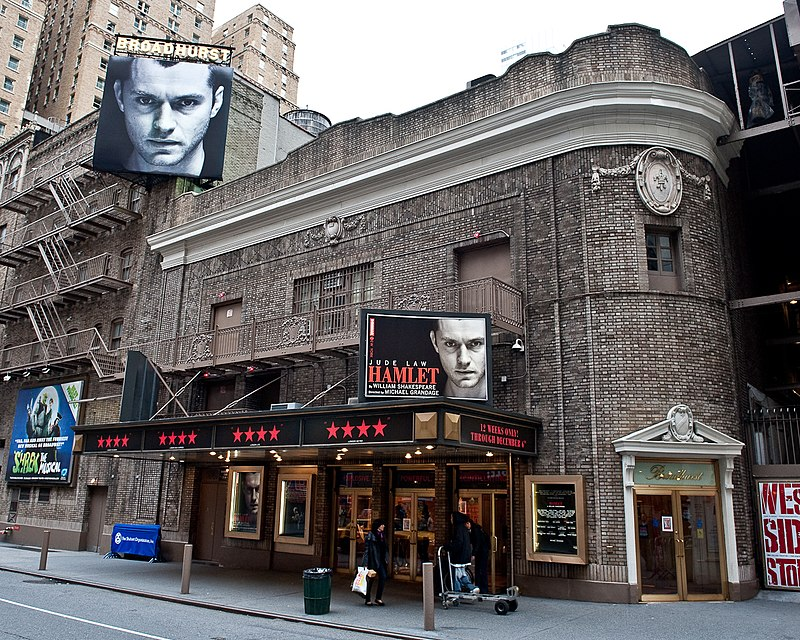

In [17]:
### Does the overall gross of the Majestic Theatre is from The Phantom of the Opera 
gross_data[gross_data['show']=='The Phantom of the Opera'].weekly_gross_overall.sum()==gross_data[gross_data['theatre']=='Majestic Theatre'].weekly_gross_overall.sum()

True

The data shows that the `Majestic Theatre` earns the most profit from only show which is `The Phantom of the Opera` and is the only show performance in the `Majestic Theatre`

Diving now into the `Broadhurst Theatre	` 

In [18]:
gross_data[gross_data['theatre']=='Broadhurst Theatre']

,week_ending,week_number,weekly_gross_overall,show,theatre,weekly_gross,potential_gross,avg_ticket_price,top_ticket_price,seats_sold,seats_in_theatre,pct_capacity,performances,previews,year,month_c,month
17,1985-06-09,1,1.040401e+07,The Odd Couple,Broadhurst Theatre,2.419211e+05,NaN,64.215778,NaN,3768,1181,0.3988,0,8,1985,Jun,6
36,1985-06-16,2,9.792420e+06,The Odd Couple,Broadhurst Theatre,3.783391e+05,NaN,68.732403,NaN,5505,1181,0.5827,7,1,1985,Jun,6
54,1985-06-23,3,9.804376e+06,The Odd Couple,Broadhurst Theatre,4.900139e+05,NaN,68.971519,NaN,7105,1181,0.7520,8,0,1985,Jun,6
72,1985-06-30,4,1.059186e+07,The Odd Couple,Broadhurst Theatre,4.480173e+05,NaN,68.652698,NaN,6525,1181,0.6906,8,0,1985,Jun,6
89,1985-07-07,5,7.774744e+06,The Odd Couple,Broadhurst Theatre,3.757903e+05,NaN,58.847053,NaN,6386,1181,0.6759,8,0,1985,Jul,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47405,2020-02-02,36,2.930169e+07,Jagged Little Pill,Broadhurst Theatre,1.055449e+06,1.397104e+06,122.367620,277.980338,8625,1125,0.9583,8,0,2020,Feb,2
47431,2020-02-09,37,3.035429e+07,Jagged Little Pill,Broadhurst Theatre,1.026840e+06,1.397104e+06,117.156895,277.980338,8765,1125,0.9739,8,0,2020,Feb,2
47457,2020-02-16,38,3.505991e+07,Jagged Little Pill,Broadhurst Theatre,1.173159e+06,1.415516e+06,130.189334,277.980338,9011,1125,1.0012,8,0,2020,Feb,2
47483,2020-02-23,39,3.285785e+07,Jagged Little Pill,Broadhurst Theatre,1.084475e+06,1.397104e+06,120.173038,277.980338,9024,1125,1.0027,8,0,2020,Feb,2


In [43]:
## Times the show ran in the Broadhurst Theatre
gross_data[gross_data['theatre']=='Broadhurst Theatre']['show'].value_counts()

Mamma Mia!                                      727
Fosse                                           140
Kiss of the Spider Woman                        115
Anastasia                                       106
Broadway Bound                                   96
Les Miserables                                   63
Aspects of Love                                  50
The Odd Couple                                   38
Into the Woods                                   38
700 Sundays                                      29
Once Upon a Mattress                             28
The History Boys                                 25
Baby It's You!                                   24
Equus                                            23
Mary Stuart                                      20
Lucky Guy                                        19
The Front Page                                   19
Cat on a Hot Tin Roof                            19
Jagged Little Pill                               18
Dance of Dea

In [19]:
## Having broadhurst theatre earning most gross, understanding the distribution of gross from the shows performed. 
nc,vc=[],[]
df = gross_data[gross_data['theatre']=='Broadhurst Theatre']
df['show'].value_counts()
for i in df['show'].value_counts().index:
    nc.append(i)
    vc.append(df[df['show']==i].weekly_gross_overall.sum())
Broadhurst_theater_gross = pd.DataFrame({'Name':nc,'overall_gross':vc})
Broadhurst_theater_gross.sort_values(by='overall_gross',ascending=False)    

,Name,overall_gross
0,Mamma Mia!,1.861136e+10
3,Anastasia,4.144158e+09
1,Fosse,2.912730e+09
2,Kiss of the Spider Woman,1.611794e+09
5,Les Miserables,1.599792e+09
4,Broadway Bound,1.124940e+09
8,Into the Woods,8.196766e+08
18,Jagged Little Pill,6.973019e+08
9,700 Sundays,6.962991e+08
12,Baby It's You!,6.717607e+08


42 shows are running in the `Broadhurst Theatre` out of which the show `Mamma Mia!` earns the highest gross

In [20]:
## Contribution of Broadhurst Theatre
(gross_data[gross_data['theatre']=='Broadhurst Theatre']['weekly_gross_overall'].sum()/gross_data['weekly_gross_overall'].sum())*100

3.862963611278013

In [21]:
## Contribution of Majestic Theatre
(gross_data[gross_data['theatre']=='Majestic Theatre']['weekly_gross_overall'].sum()/gross_data['weekly_gross_overall'].sum())*100

3.4070085958642817

The `Broadhurst Theatre` contributes to only 3.86% of the entire broadway industry and `Majestic Theatre` contributes to 3.4% which is a great figure there is only one show runs in the theatre

### What is the contribution of all the theatres in Broadway Industry?

In [22]:
vm,nm=[],[]
for i in gross_data['theatre'].value_counts().index:
    nm.append(i)
    vm.append((gross_data[gross_data['theatre']==i]['weekly_gross_overall'].sum()/gross_data['weekly_gross_overall'].sum())*100)
dt = pd.DataFrame({'Theatre_Name':nm,'Gross_contribution':vm})
dt.sort_values(by='Gross_contribution',ascending=False)   

,Theatre_Name,Gross_contribution
0,Broadhurst Theatre,3.862964
1,Minskoff Theatre,3.625933
4,Ambassador Theatre,3.486988
2,Majestic Theatre,3.407009
5,Gershwin Theatre,3.119676
3,Imperial Theatre,3.100069
7,Lunt-Fontanne Theatre,3.063014
6,Eugene O'Neill Theatre,3.018770
8,St. James Theatre,2.798153
13,Richard Rodgers Theatre,2.699040


The percentage contribution suggests that the Theatre's 

`Jack Lawrence Theatre
Comedy Theatre
Mark Hellinger Theatre
46th Street Theatre
Edison Theatre
Helen Hayes Theater
Henry Miller's Theatre
Hilton Theatre
Biltmore Theatre
Foxwoods Theatre
Hudson Theatre
Criterion Center Stage Right
Ford Center for the Performing Arts
Lyric Theatre
Martin Beck Theatre	
Royale Theatre 
Plymouth Theatre` contributes less than 1%

In [128]:
dt.describe()

,Gross_contribution
count,58.000000
mean,1.724138
std,1.071700
min,0.013213
25%,0.736920
50%,1.891611
75%,2.488445
max,3.862964


In [23]:
dt[dt['Gross_contribution']>=3]

,Theatre_Name,Gross_contribution
0,Broadhurst Theatre,3.862964
1,Minskoff Theatre,3.625933
2,Majestic Theatre,3.407009
3,Imperial Theatre,3.100069
4,Ambassador Theatre,3.486988
5,Gershwin Theatre,3.119676
6,Eugene O'Neill Theatre,3.018770
7,Lunt-Fontanne Theatre,3.063014


In [27]:
dt[dt['Gross_contribution']>=3]['Gross_contribution']

0    3.862964
1    3.625933
2    3.407009
3    3.100069
4    3.486988
5    3.119676
6    3.018770
7    3.063014
Name: Gross_contribution, dtype: float64

In [26]:
dt.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58 entries, 0 to 57
Data columns (total 2 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Theatre_Name        58 non-null     object 
 1   Gross_contribution  58 non-null     float64
dtypes: float64(1), object(1)
memory usage: 1.0+ KB


In [48]:
## Gross of those theatres which contributes to more than or equal to 3%
a = (dt[dt['Gross_contribution']>=3]['Gross_contribution'].sum()/dt['Gross_contribution'].sum())*100
a

26.68442340834638

In [37]:
## Gross of those theatres which contributes to more than or equal to 2%
(dt[dt['Gross_contribution']>=2]['Gross_contribution'].sum()/dt['Gross_contribution'].sum())*100

68.31850152033455

In [49]:
## Gross of those theatres which contributes in between 2% to 3%
b = (dt.loc[(dt['Gross_contribution']<3) & (dt['Gross_contribution']>=2)]['Gross_contribution'].sum()/dt['Gross_contribution'].sum())*100
#len(dt.loc[(dt['Gross_contribution']<3) & (dt['Gross_contribution']>=2)])/len(dt)*100
b

41.634078111988174

In [50]:
## Gross of those theatres which contributes in between 1% to 2%
c = (dt.loc[(dt['Gross_contribution']<2) & (dt['Gross_contribution']>=1)]['Gross_contribution'].sum()/dt['Gross_contribution'].sum())*100
c

24.442499757358465

In [40]:
## Gross of those theatres which contributes in between 1% to 3%
(dt.loc[(dt['Gross_contribution']<3) & (dt['Gross_contribution']>=1)]['Gross_contribution'].sum()/dt['Gross_contribution'].sum())*100

66.07657786934665

In [51]:
## Gross of those theatres which contributes in between more than 0% to 1%
d = (dt.loc[(dt['Gross_contribution']<1) & (dt['Gross_contribution']>=0)]['Gross_contribution'].sum()/dt['Gross_contribution'].sum())*100
#len(dt.loc[(dt['Gross_contribution']<1) & (dt['Gross_contribution']>=0)])/len(dt)*100
d

7.238998722306973

<AxesSubplot:>

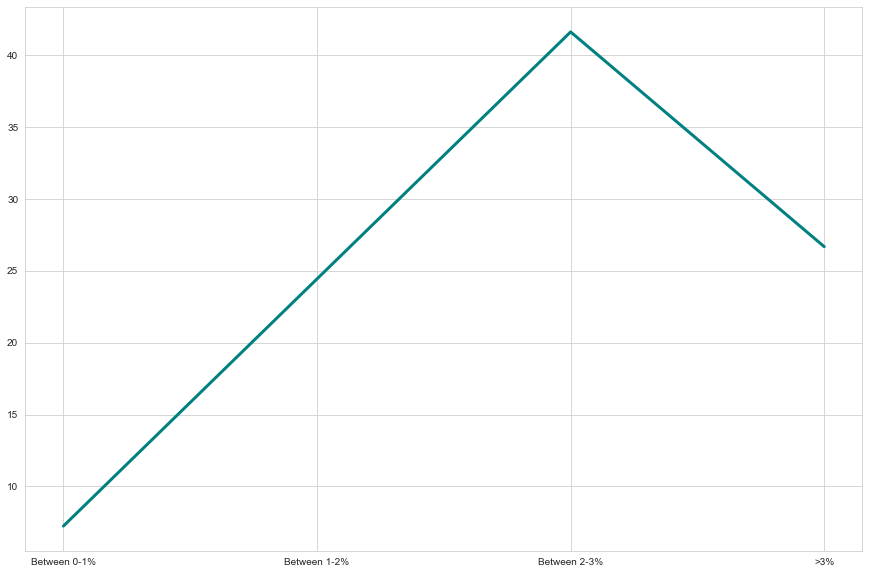

In [47]:
x1 = [d,c,b,a]
y1 = ['Between 0-1%','Between 1-2%','Between 2-3%','>3%']
sns.lineplot(x=y1,y=x1,color="teal",linewidth="3")
#plt.plot(y,x)

In [52]:
less_value=[]
for i in dt[dt['Gross_contribution']<1]['Theatre_Name']:
    less_value.append(i)

In [53]:
less_value ##i=18

['Plymouth Theatre',
 'Royale Theatre',
 'Martin Beck Theatre',
 'Ford Center for the Performing Arts',
 'Criterion Center Stage Right',
 'Edison Theatre',
 'Lyric Theatre',
 '46th Street Theatre',
 'Biltmore Theatre',
 'Foxwoods Theatre',
 "Henry Miller's Theatre",
 'Hilton Theatre',
 'Hudson Theatre',
 'Helen Hayes Theater',
 'Ritz Theatre',
 'Mark Hellinger Theatre',
 'Jack Lawrence Theatre',
 'Comedy Theatre']

In [54]:
val=[]
for i in less_value:
    val.append(gross_data[gross_data['theatre']==i])
val[0]

,week_ending,week_number,weekly_gross_overall,show,theatre,weekly_gross,potential_gross,avg_ticket_price,top_ticket_price,seats_sold,seats_in_theatre,pct_capacity,performances,previews,year,month_c,month
240,1985-09-15,15,7.530156e+06,The Search for Signs of Intelligent Life in th...,Plymouth Theatre,175650.528984,NaN,33.960161,NaN,5172,1068,0.9685,0,5,1985,Sep,9
257,1985-09-22,16,7.830186e+06,The Search for Signs of Intelligent Life in th...,Plymouth Theatre,387902.858975,NaN,49.894703,NaN,7774,1068,1.0399,0,7,1985,Sep,9
274,1985-09-29,17,8.071782e+06,The Search for Signs of Intelligent Life in th...,Plymouth Theatre,427604.219497,NaN,61.700028,NaN,6930,1068,0.9270,5,2,1985,Sep,9
291,1985-10-06,18,8.874068e+06,The Search for Signs of Intelligent Life in th...,Plymouth Theatre,515258.293482,NaN,64.714509,NaN,7961,1068,0.9318,8,0,1985,Oct,10
309,1985-10-13,19,1.069257e+07,The Search for Signs of Intelligent Life in th...,Plymouth Theatre,549021.124011,NaN,64.134347,NaN,8562,1068,1.0021,8,0,1985,Oct,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22758,2004-04-25,48,2.461624e+07,Match,Plymouth Theatre,412862.623982,937548.002626,75.400965,126.237965,5476,1079,0.6344,8,0,2004,Apr,4
22790,2004-05-02,49,2.246147e+07,Match,Plymouth Theatre,388998.388596,932447.088575,77.833982,125.551143,4998,1079,0.5790,8,0,2004,May,5
22821,2004-05-09,50,2.341580e+07,Match,Plymouth Theatre,388244.309119,932447.088575,79.889158,125.551143,4860,1079,0.5630,8,0,2004,May,5
22853,2004-05-16,51,2.415862e+07,Match,Plymouth Theatre,340752.754472,932447.088575,82.531526,125.551143,4129,1079,0.4783,8,0,2004,May,5


['Plymouth Theatre']
The shows performed here ['The Search for Signs of Intelligent Life in the Universe'
 'The House of Blue Leaves' 'Pygmalion' 'Burn This' 'The Big Love'
 'Dancing at Lughnasa' 'Gypsy Passion' 'The Song of Jacob Zulu'
 'Wonderful Tennessee' 'Passion' 'Translations'
 'Chronicle of a Death Foretold' 'A Delicate Balance' 'Jekyll & Hyde'
 'Bells Are Ringing' 'Thou Shalt Not' 'The Graduate'
 "Long Day's Journey Into Night" 'Taboo' 'Match']


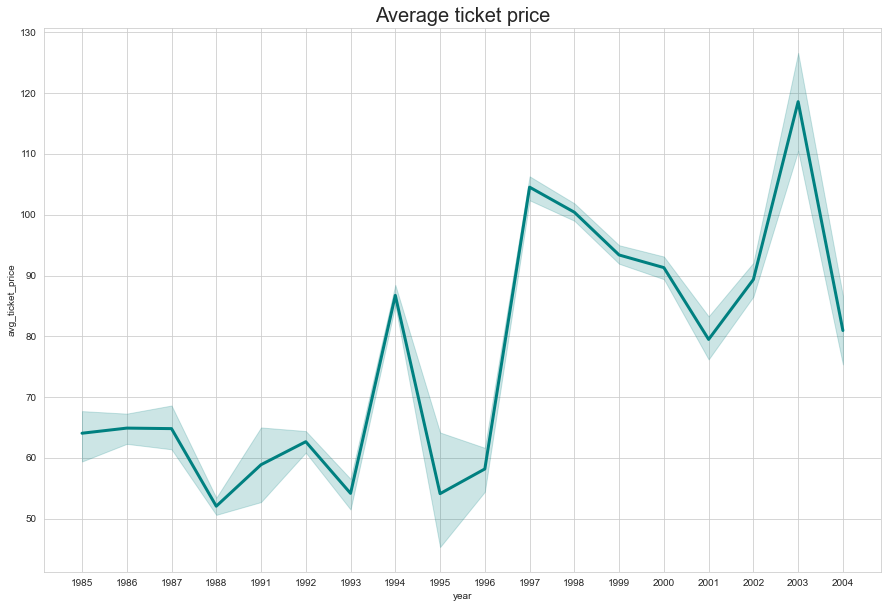

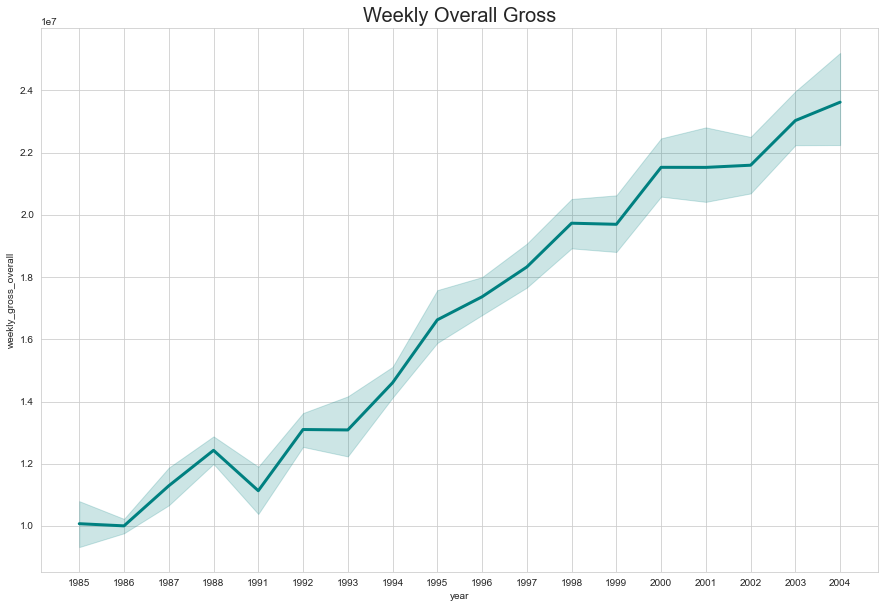

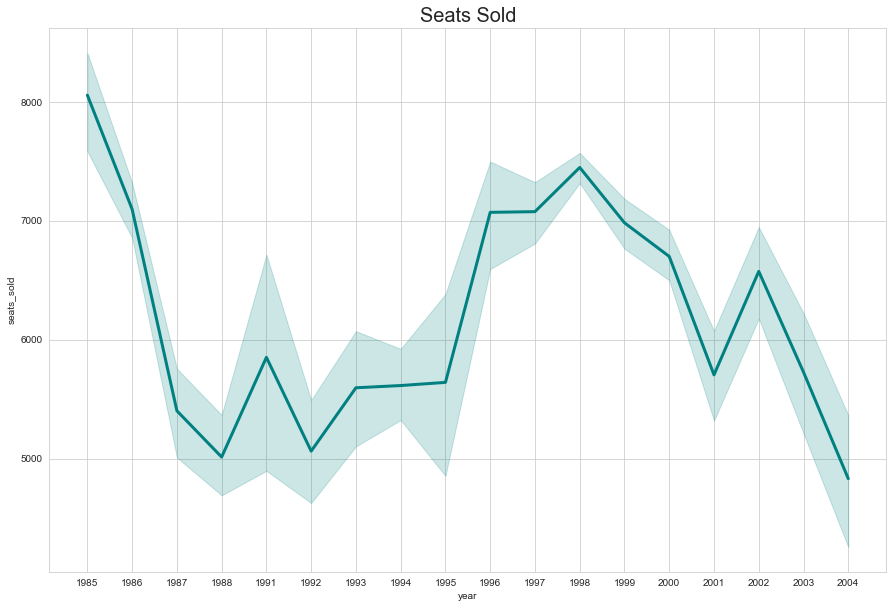

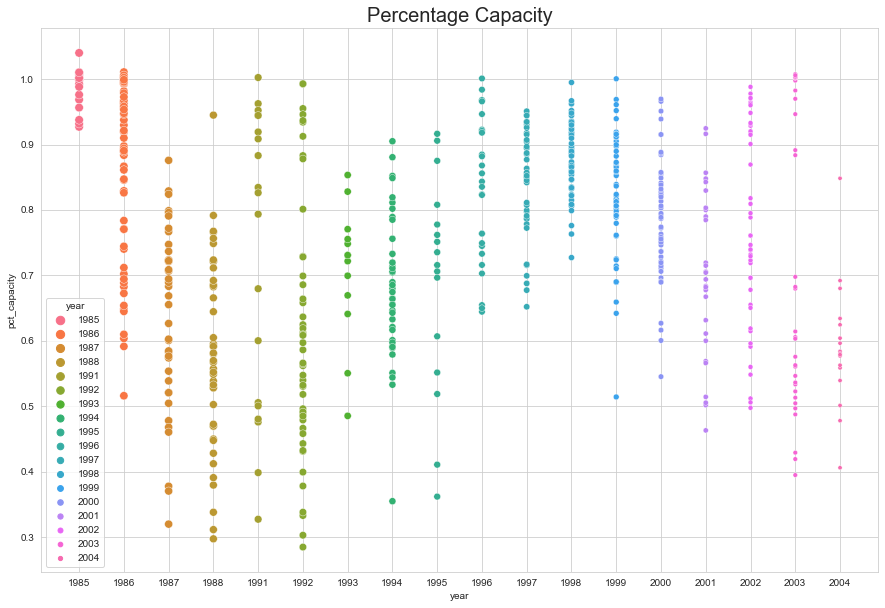

['Royale Theatre']
The shows performed here ['Song and Dance' 'Sweet Sue' 'Broadway' 'Roza' 'Serious Money'
 'Speed-the-Plow' 'Lend Me a Tenor' 'Conversations with My Father'
 'The Kentucky Cycle' 'An Inspector Calls' 'Inherit the Wind' 'Skylight'
 'Dream' 'Triumph of Love' 'Art' 'The Price' 'Copenhagen'
 "One Flew Over the Cuckoo's Nest" 'Sexaholix' 'The Elephant Man'
 'Prune Danish' "Ma Rainey's Black Bottom"
 '"Master Harold"...and the Boys' 'Anna in the Tropics'
 'A Raisin in the Sun' "'night, Mother"]


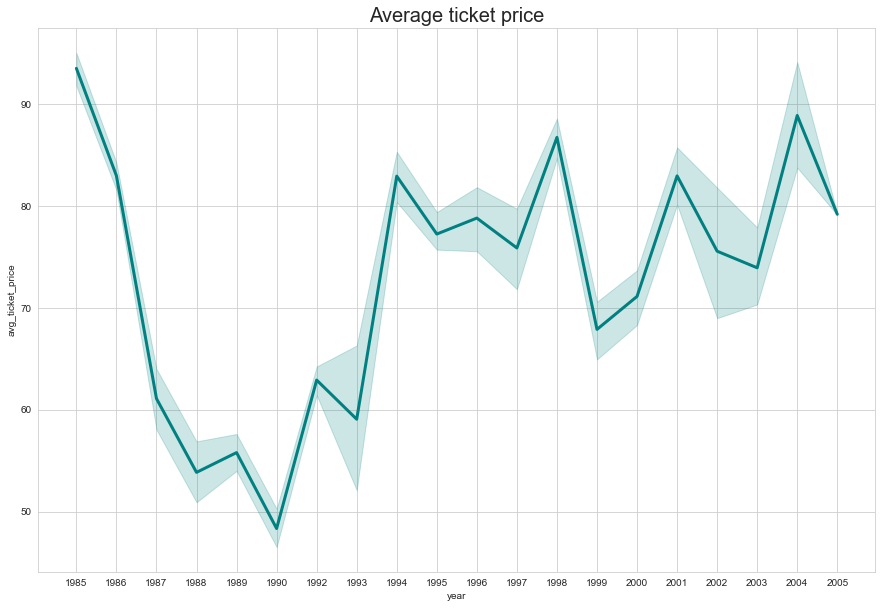

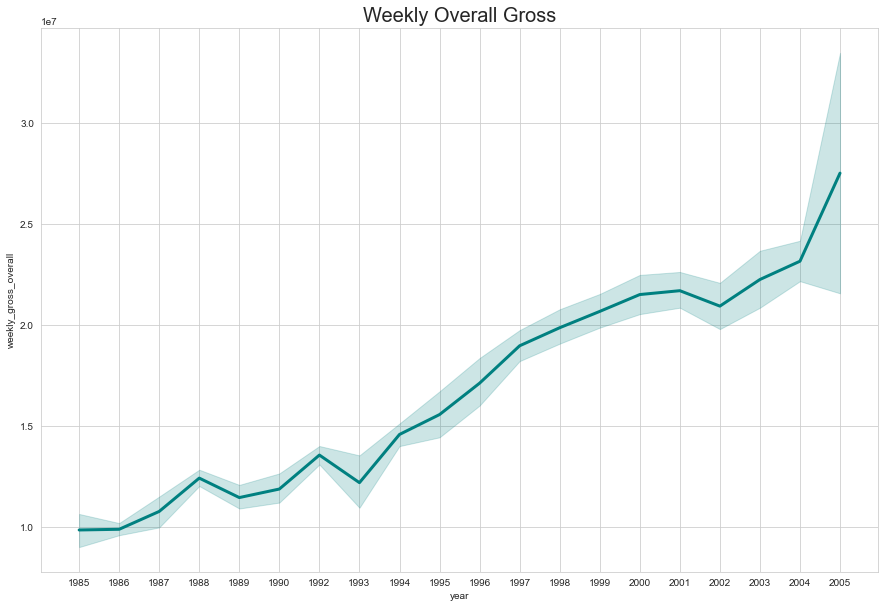

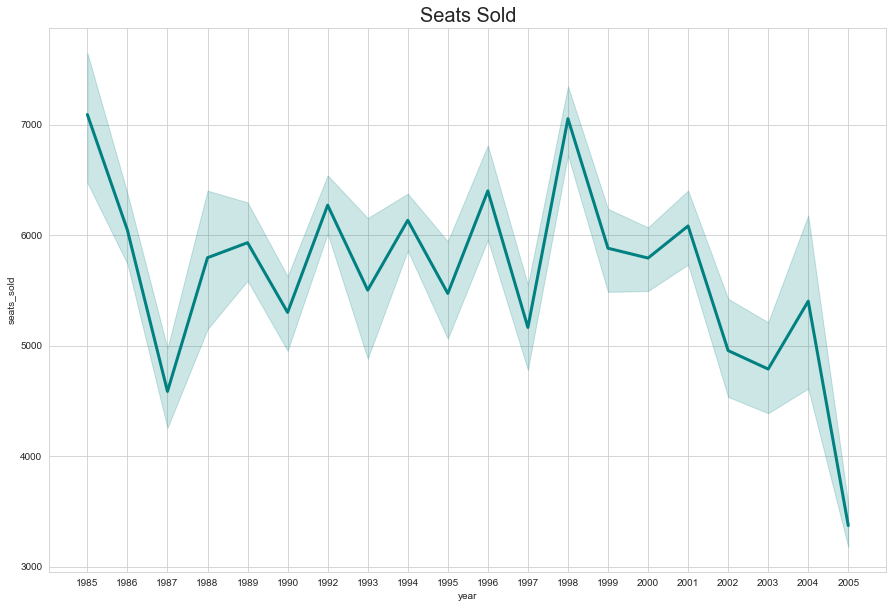

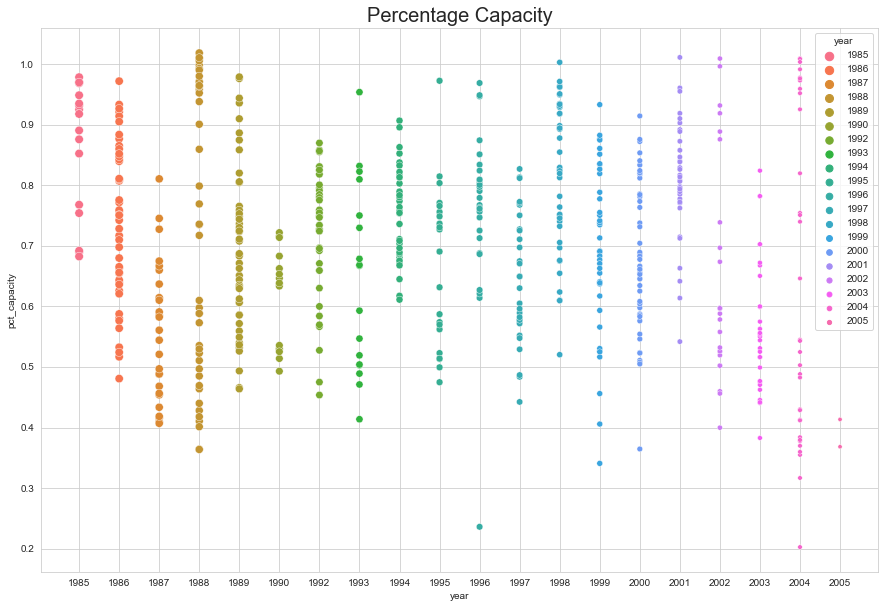

['Martin Beck Theatre']
The shows performed here ['Into the Woods' 'Guys and Dolls' 'My Thing of Love' 'Moon Over Buffalo'
 'David Copperfield: Dreams and Nightmares' 'Annie' 'The Cherry Orchard'
 'Eugene Onegin' 'The Sound of Music' 'Kiss Me, Kate'
 'Sweet Smell of Success' 'Man of La Mancha']


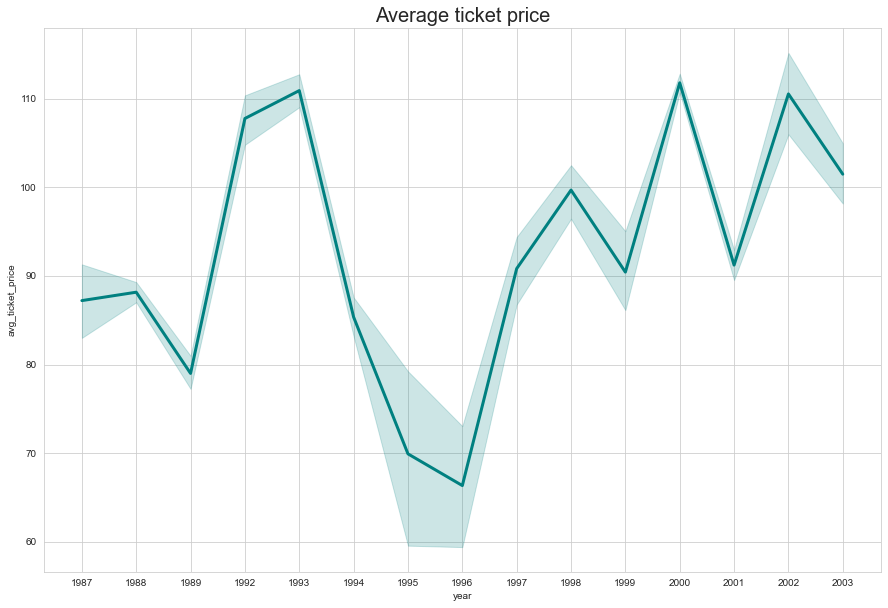

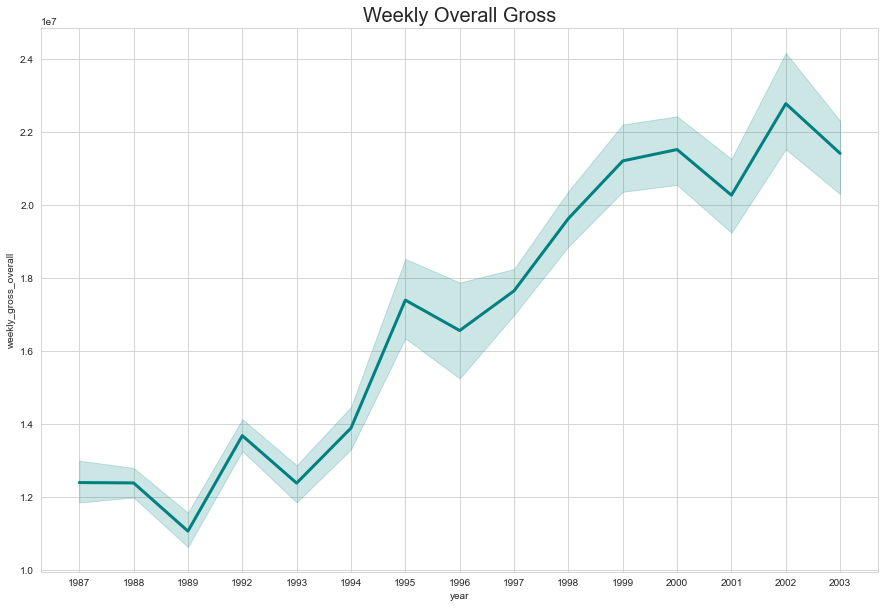

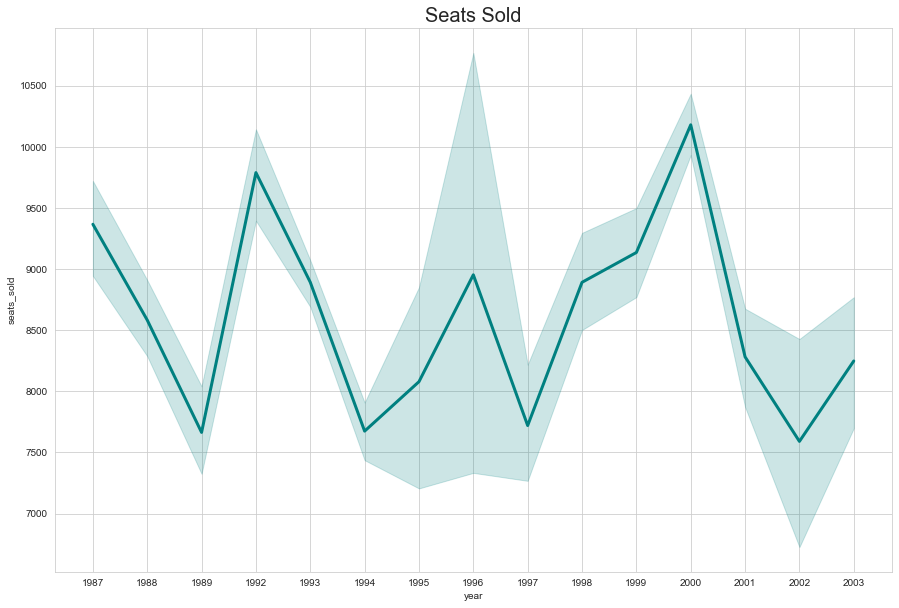

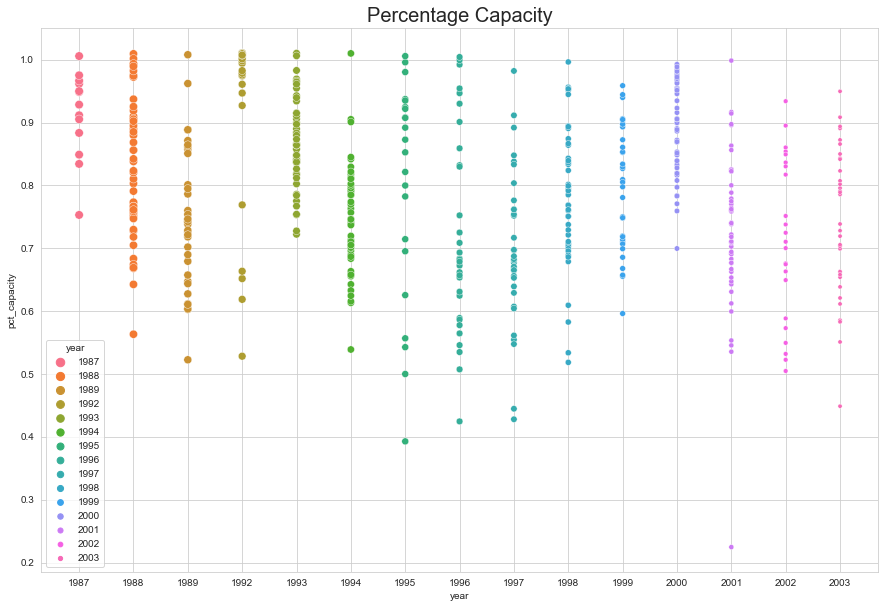

['Ford Center for the Performing Arts']
The shows performed here ['Ragtime' 'Jesus Christ Superstar' '42nd Street']


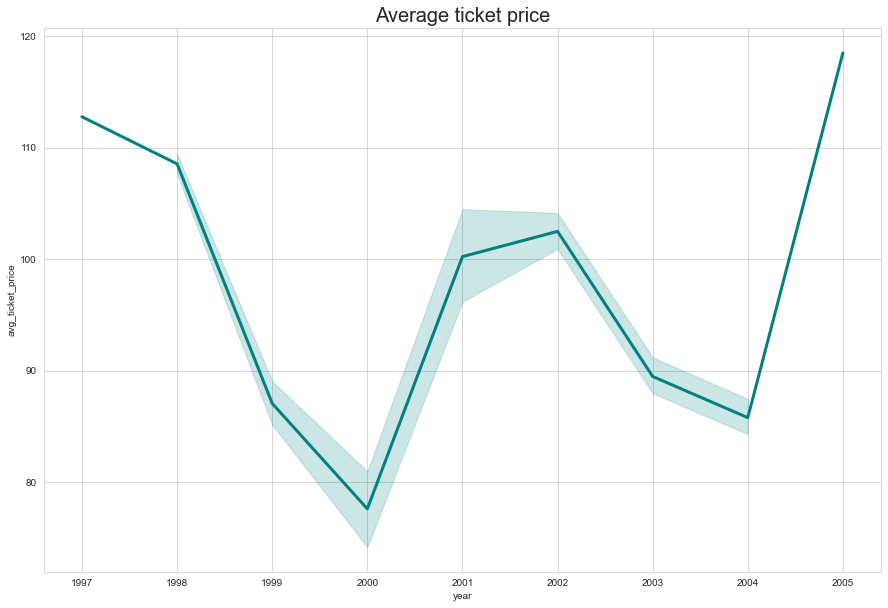

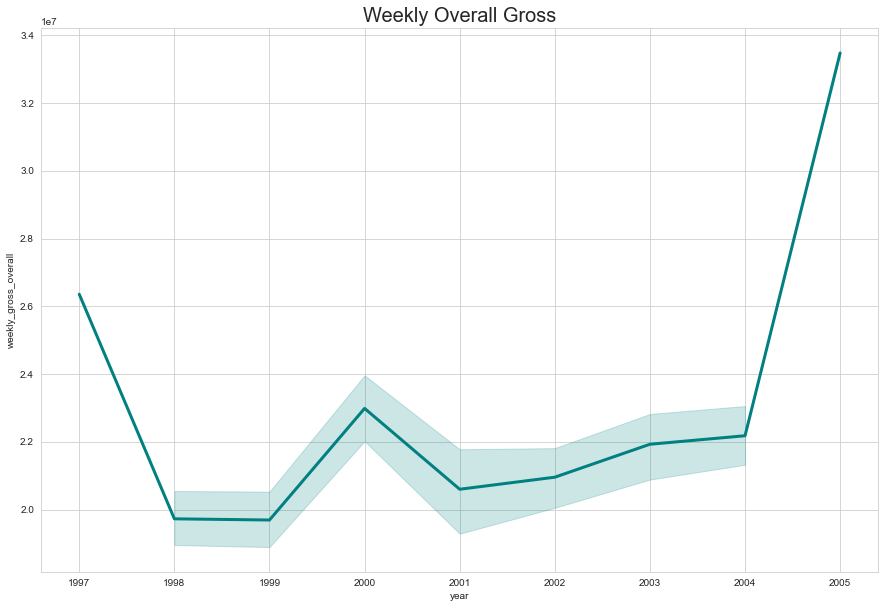

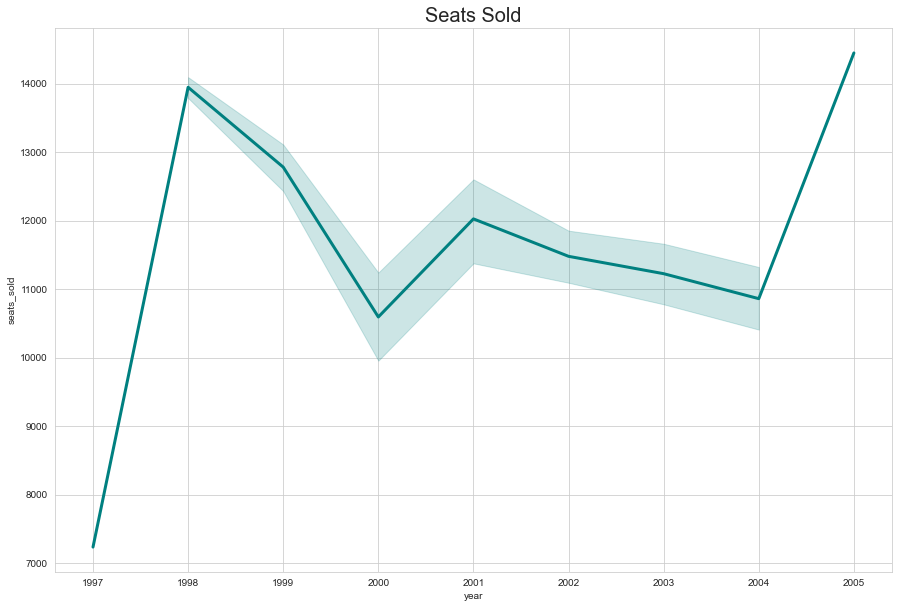

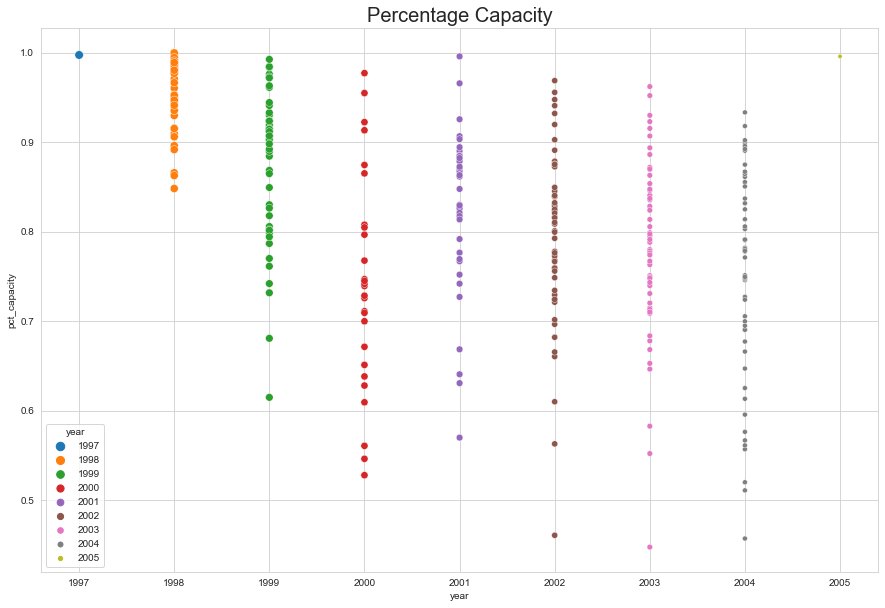

['Criterion Center Stage Right']
The shows performed here ['Starmites' 'Mastergate' 'Stand-Up Tragedy' 'The Homecoming' 'The Visit'
 'Hamlet' 'The Price'
 'The Real Inspector Hound and the Fifteen Minute Hamlet' 'The Show Off'
 'Anna Christie' 'Candida' 'A Grand Night for Singing' "No Man's Land"
 'Picnic' 'Hedda Gabler' 'Philadelphia, Here I Come!'
 'The Glass Menagerie' 'A Month in the Country' "The Play's the Thing"
 'Company' 'The Father' 'The Night of the Iguana' 'A Thousand Clowns'
 'Summer and Smoke' 'The Rehearsal' 'The Three Sisters' 'London Assurance'
 'The Deep Blue Sea' 'Little Me' 'The Lion in Winter']


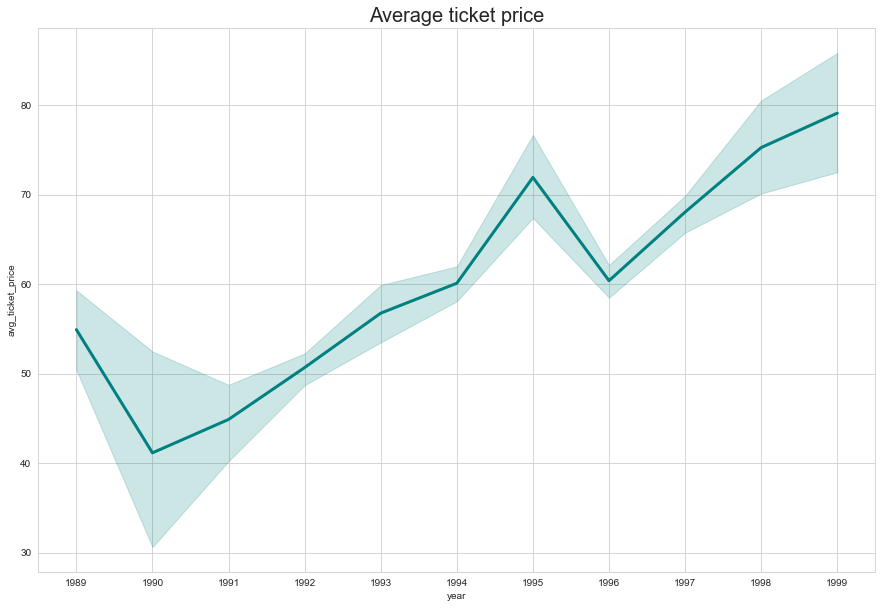

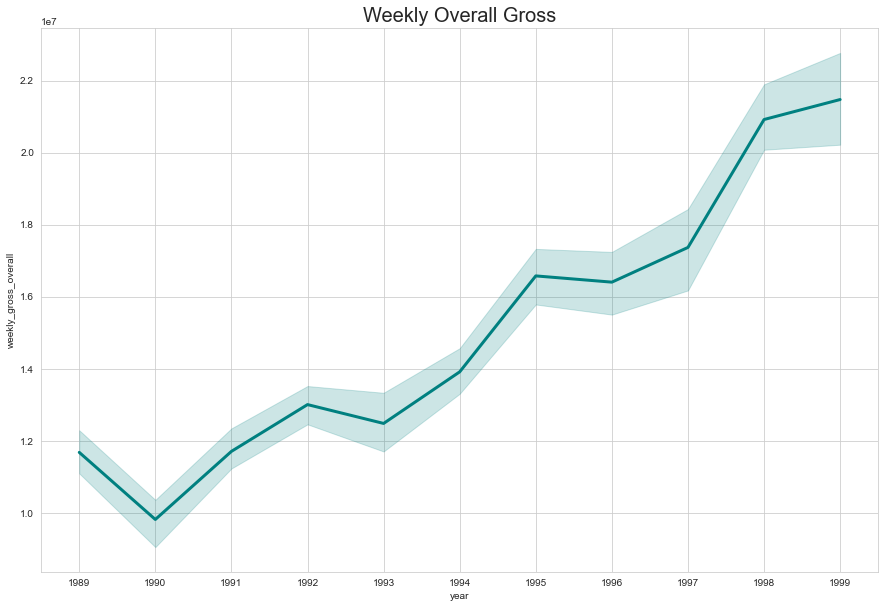

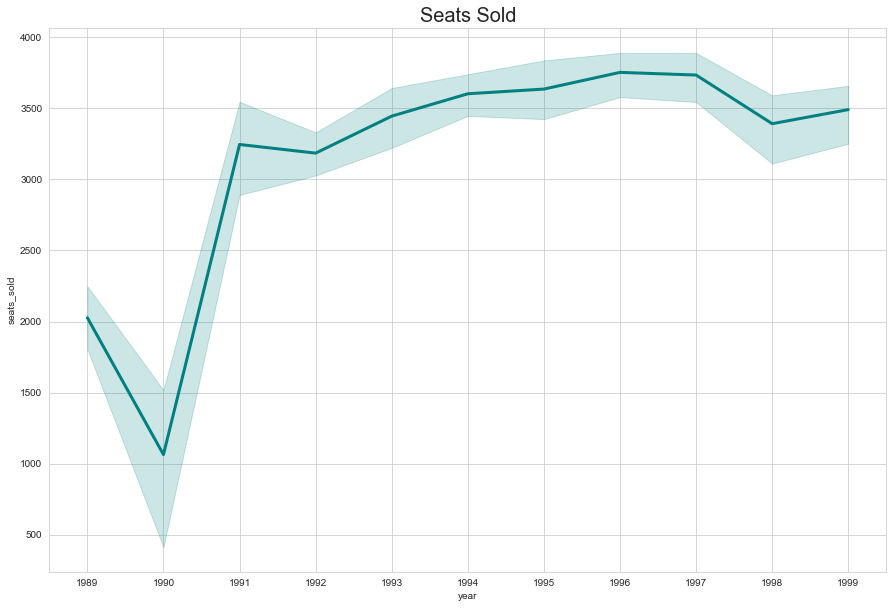

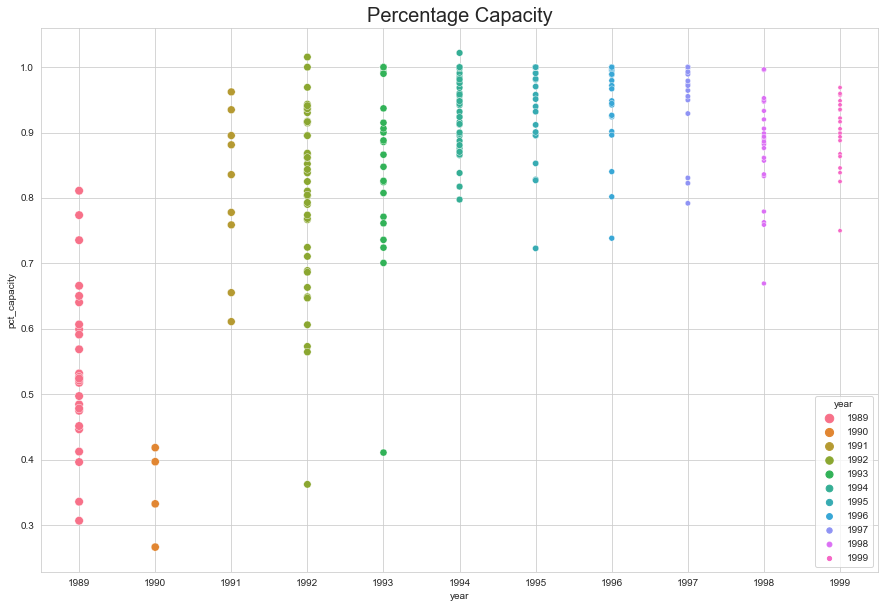

['Edison Theatre']
The shows performed here ['Oh! Calcutta!' 'Love Letters' 'A Change in the Heir'
 'Those Were the Days']


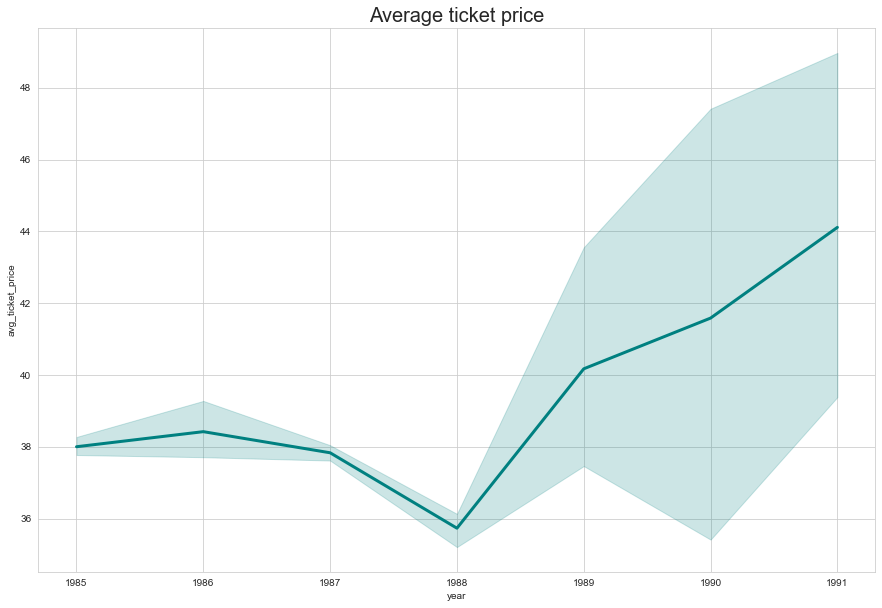

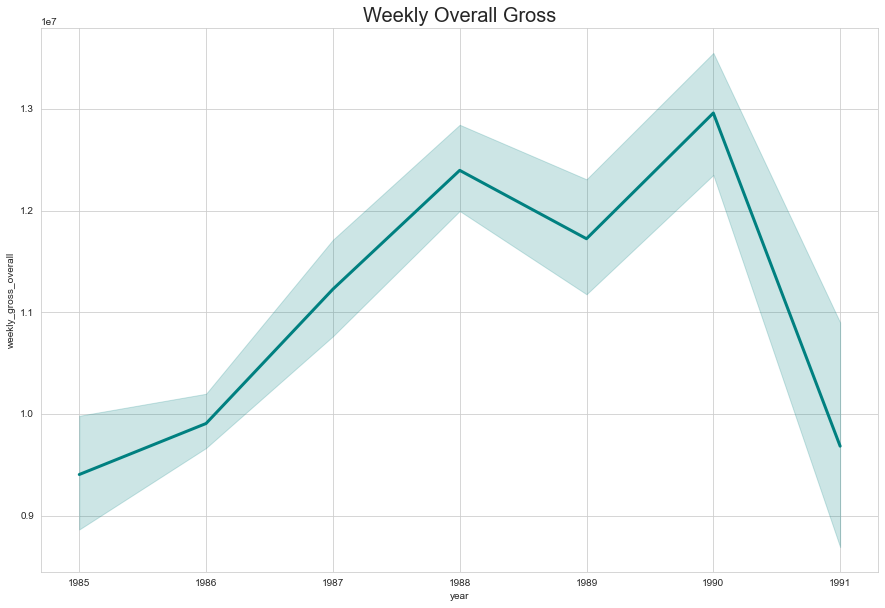

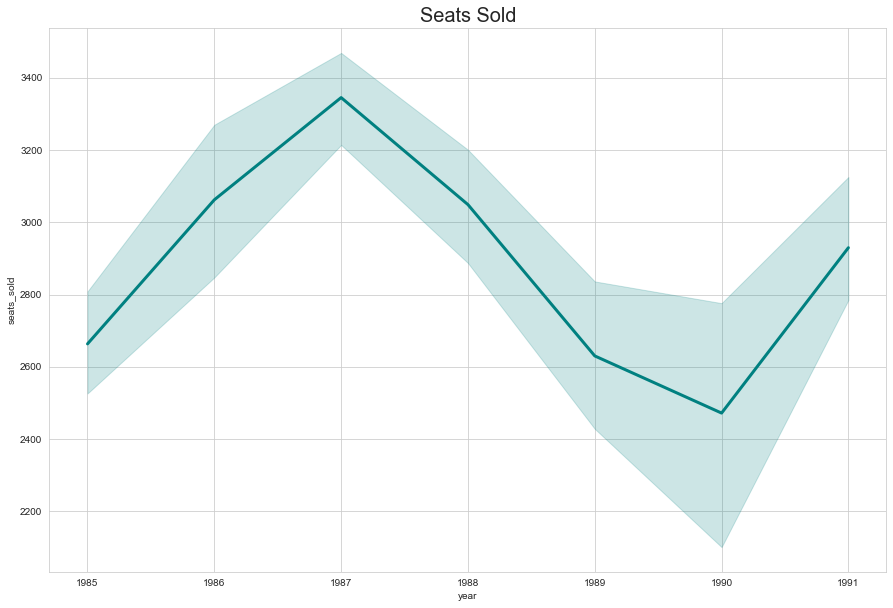

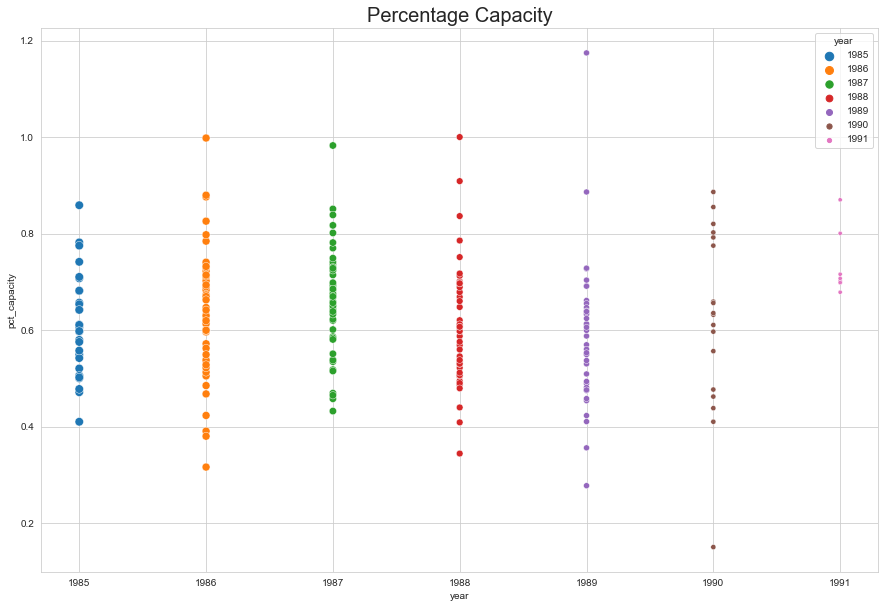

['Lyric Theatre']
The shows performed here ['On the Town' 'Lord of the Dance: Dangerous Games'
 'Cirque du Soleil Paramour'
 'Harry Potter and the Cursed Child, Parts One and Two']


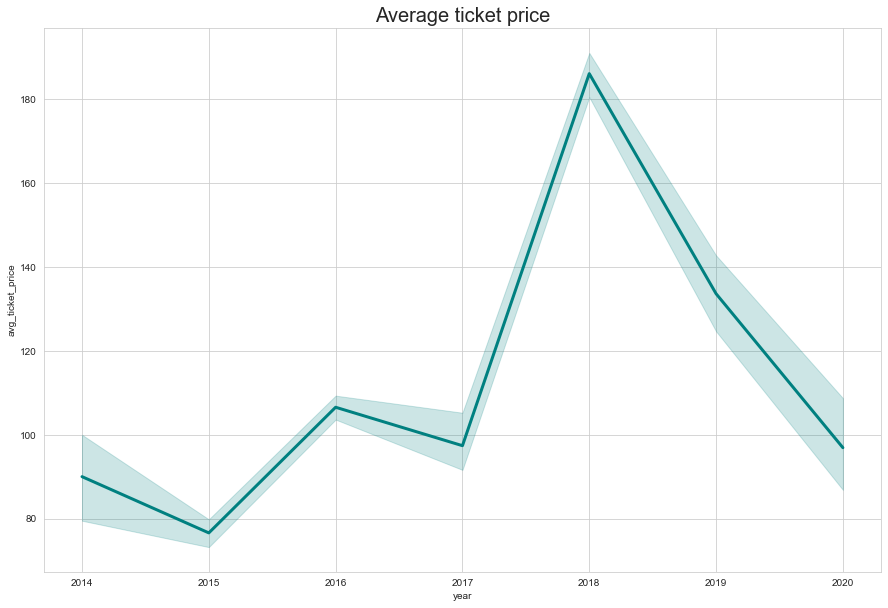

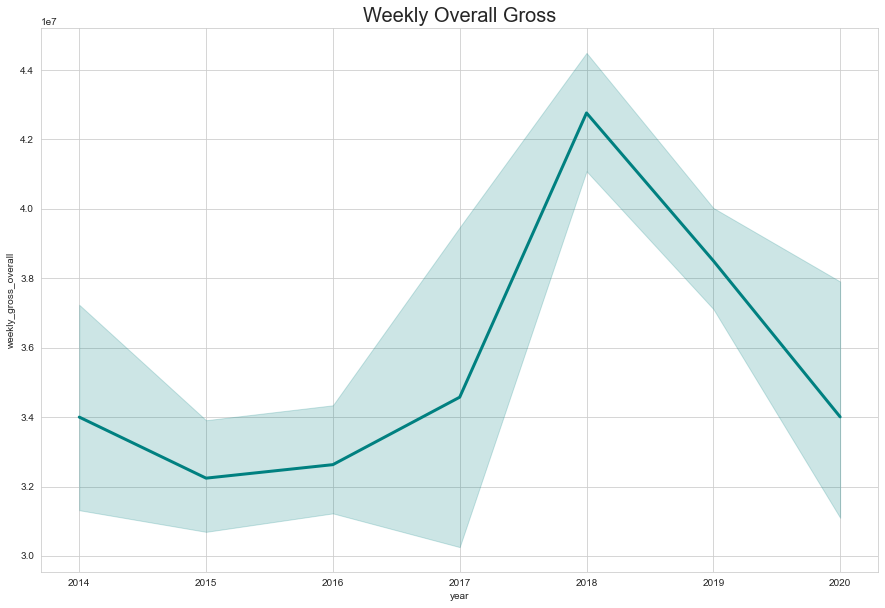

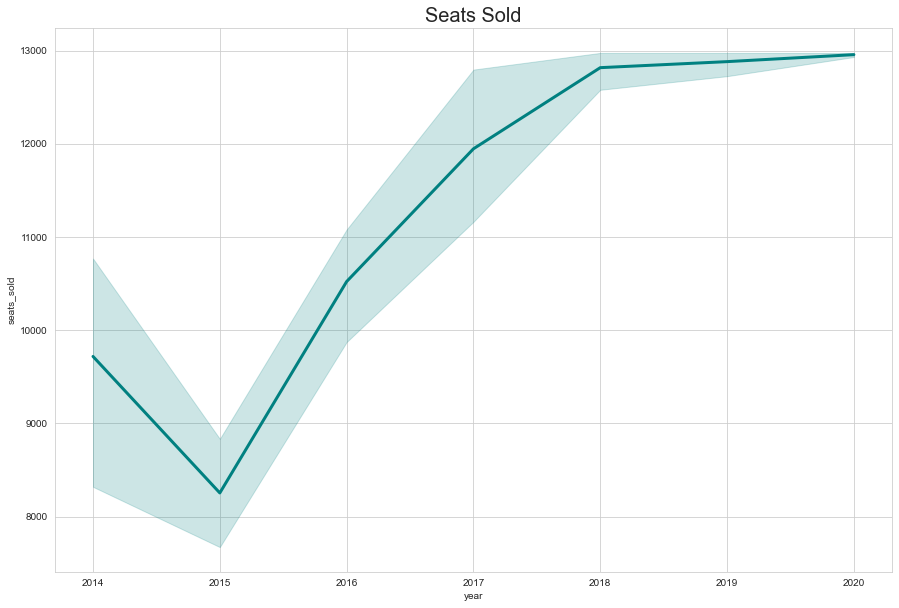

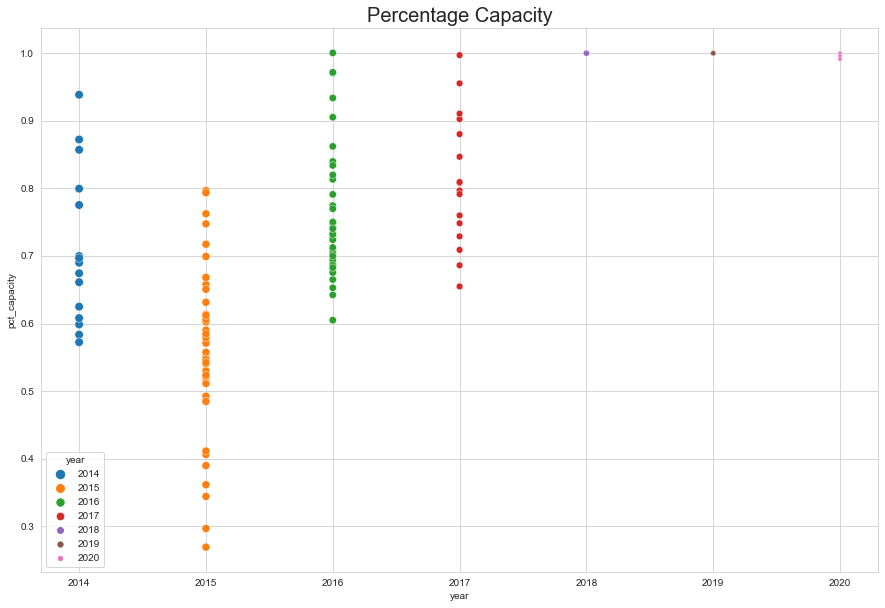

['46th Street Theatre']
The shows performed here ['Brighton Beach Memoirs' 'Arsenic and Old Lace' 'Fences' 'Checkmates'
 'Born Yesterday' 'The Merchant of Venice']


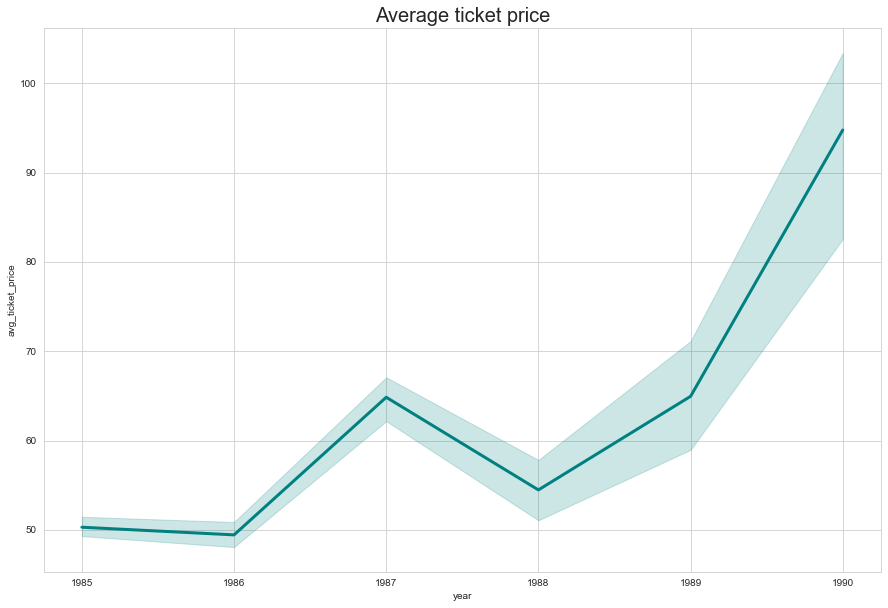

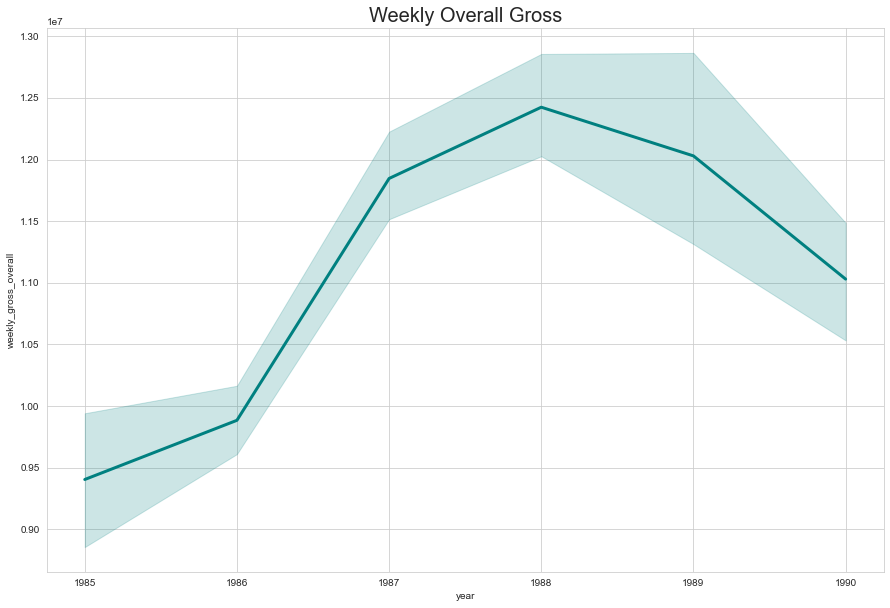

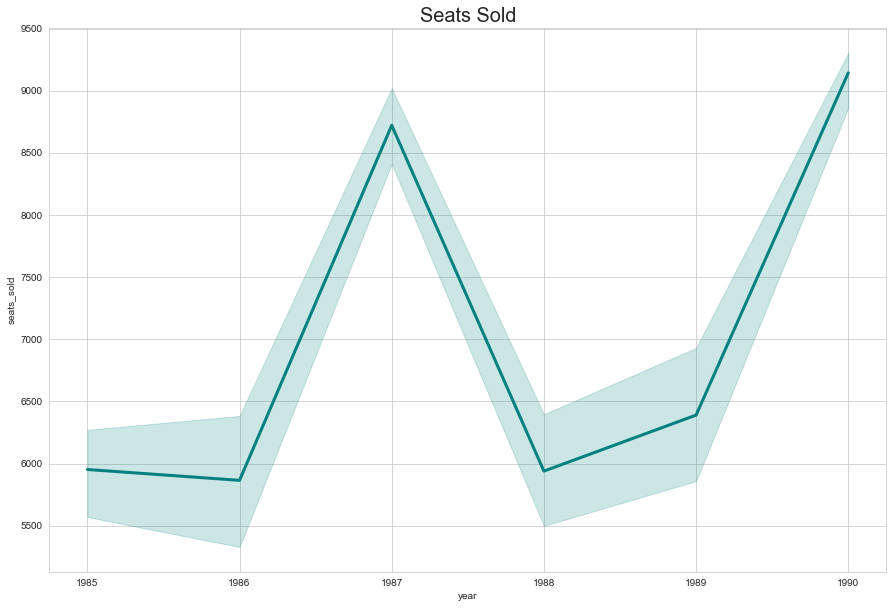

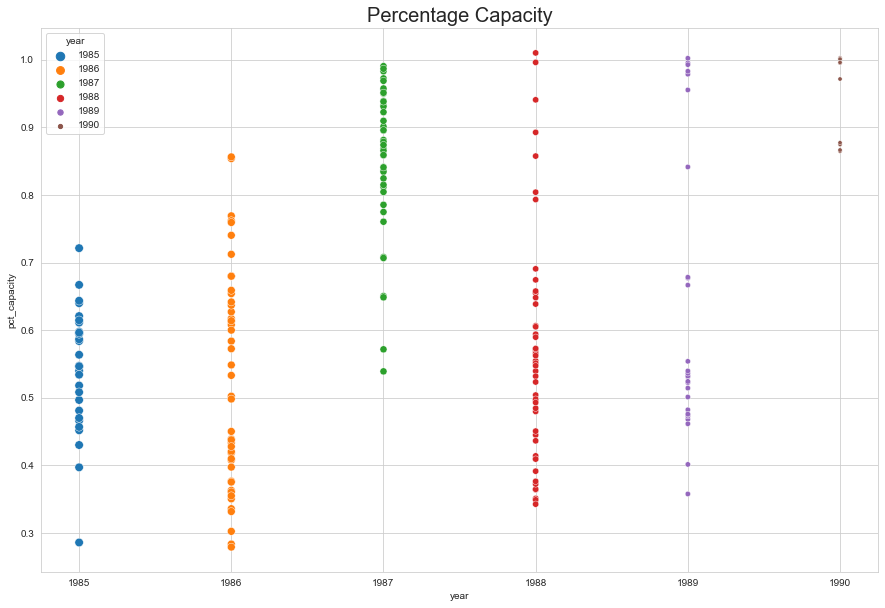

['Biltmore Theatre']
The shows performed here ['The Boys of Winter' 'Honky Tonk Nights' 'Stardust' 'The Violet Hour'
 'Drowning Crow' 'Sight Unseen' 'Reckless' 'Brooklyn Boy'
 'After the Night and the Music' 'Absurd Person Singular' 'Rabbit Hole'
 'Shining City' 'Losing Louie' 'Translations' 'Lovemusik' 'Mauritius'
 'Come Back, Little Sheba' 'Top Girls']


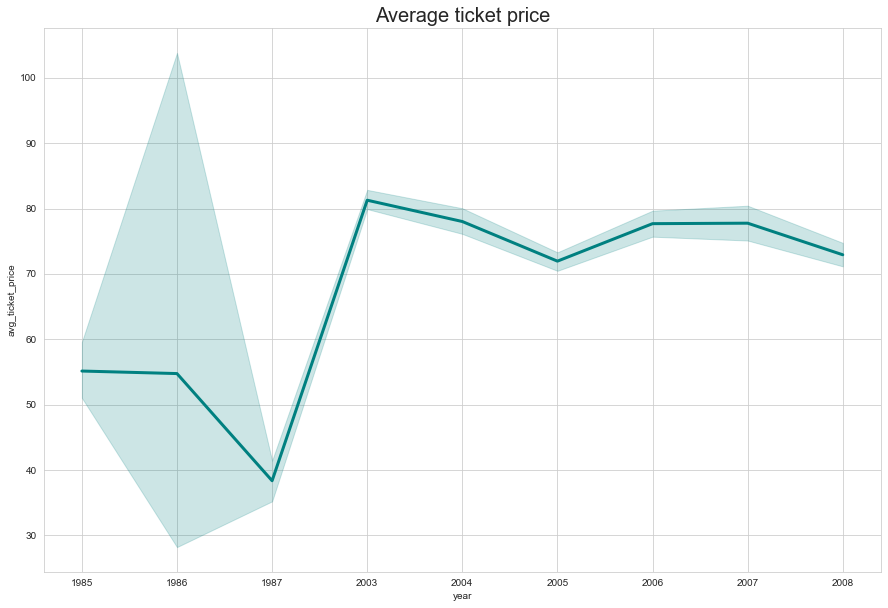

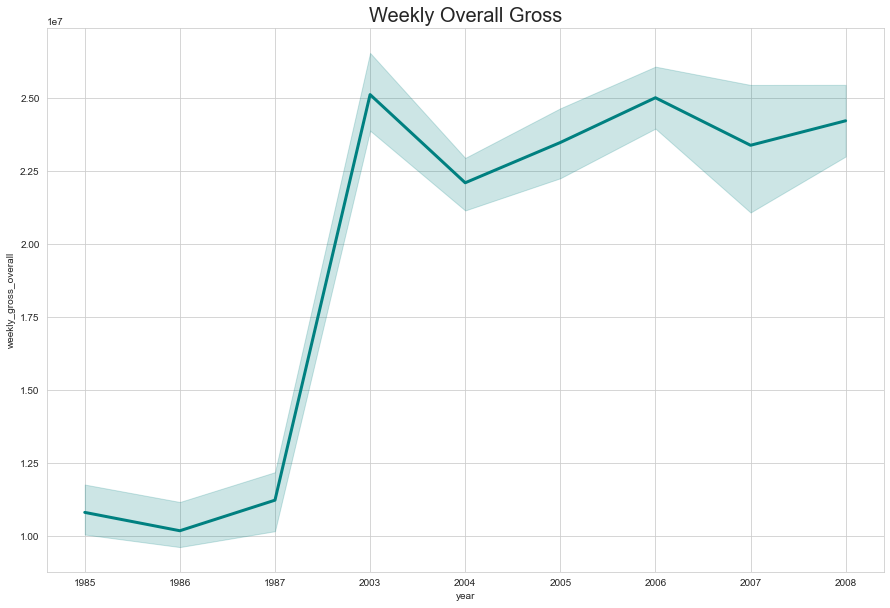

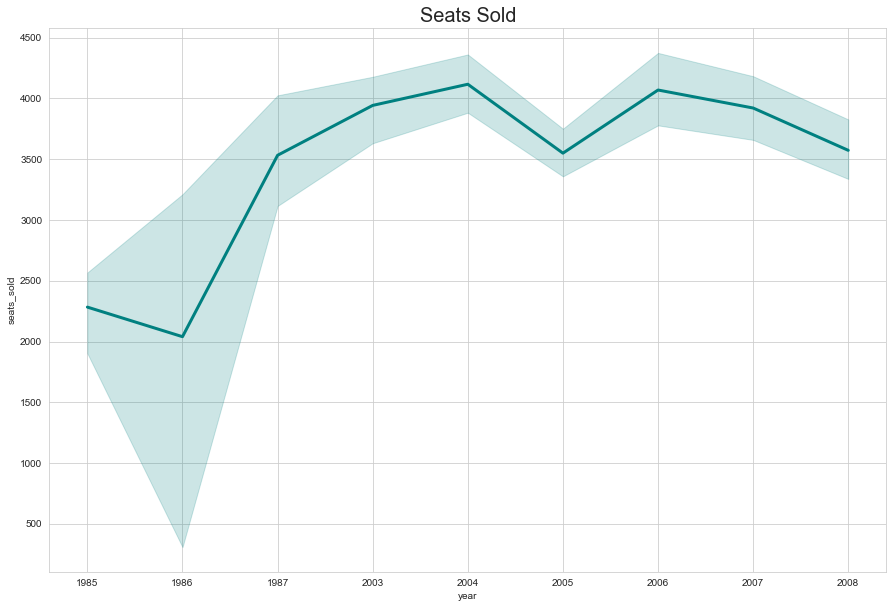

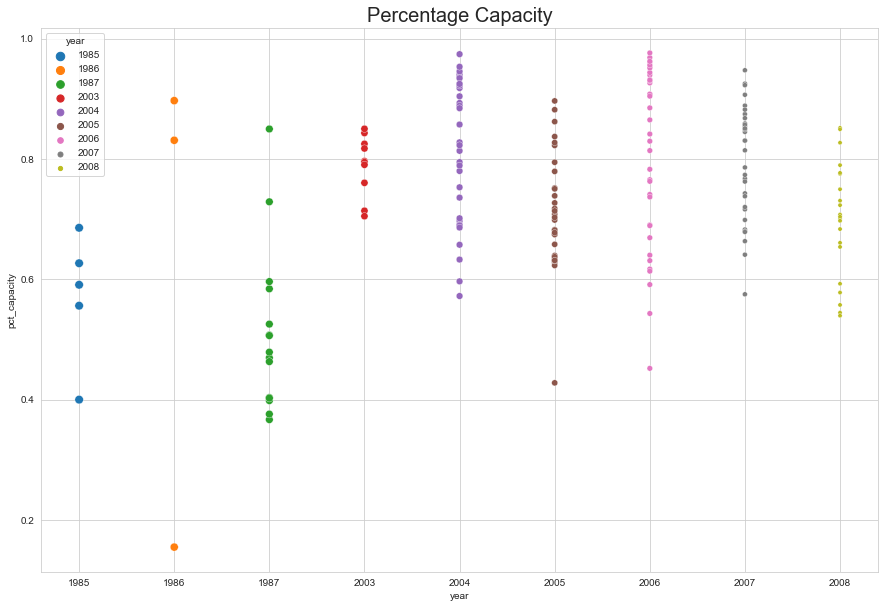

['Foxwoods Theatre']
The shows performed here ['Spider-Man Turn Off the Dark']


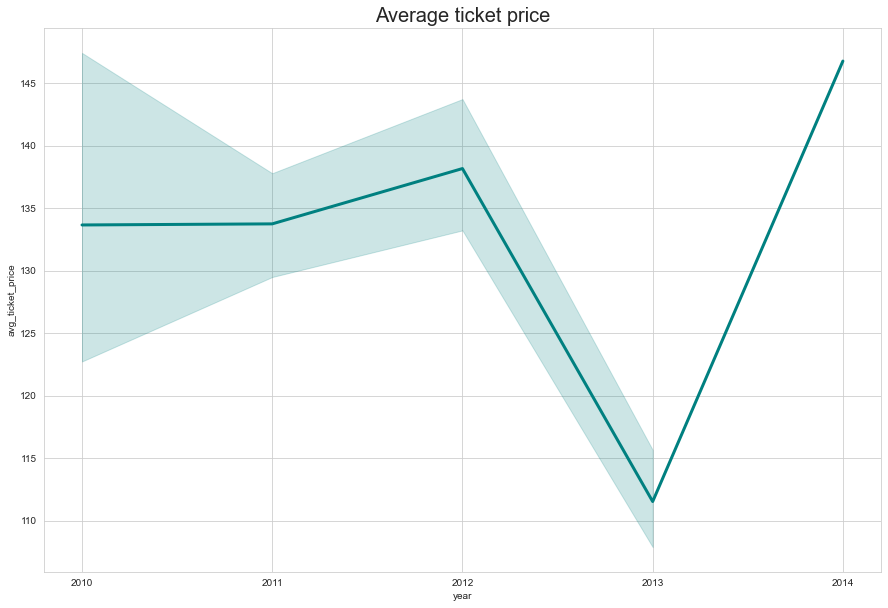

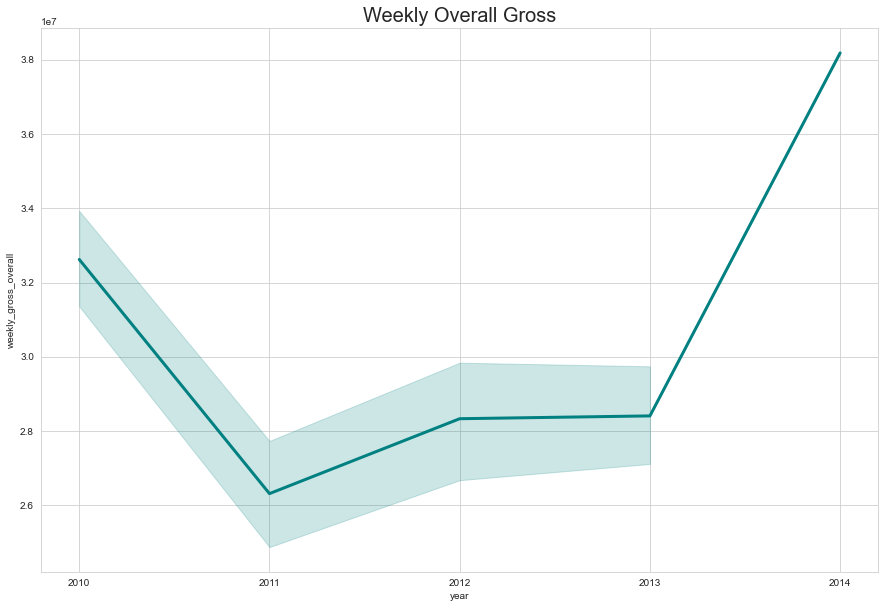

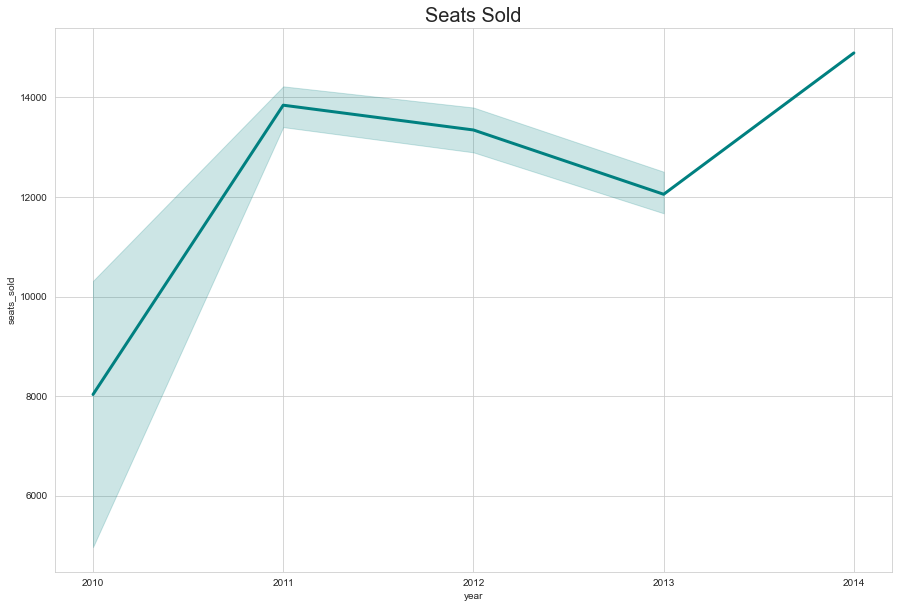

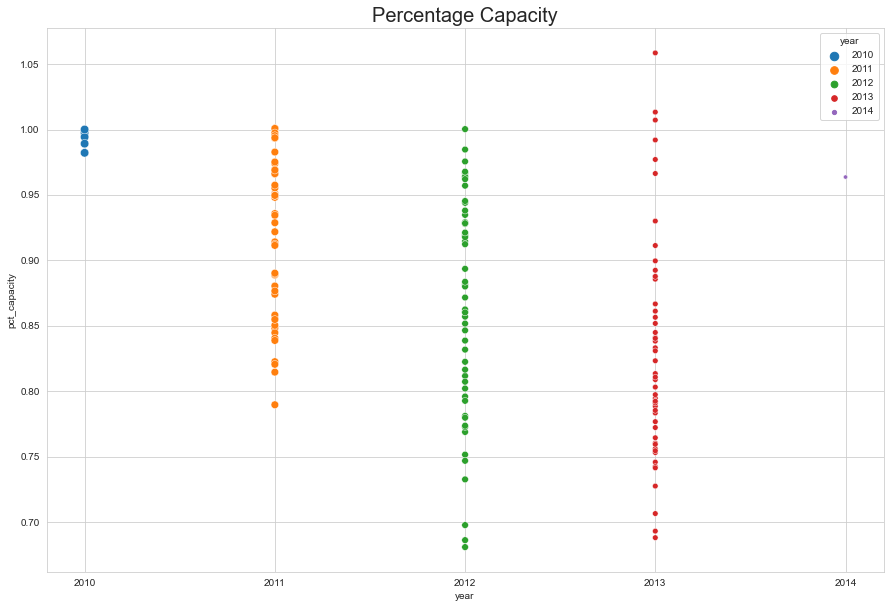

["Henry Miller's Theatre"]
The shows performed here ['Urinetown The Musical' 'Bye Bye Birdie' 'All About Me']


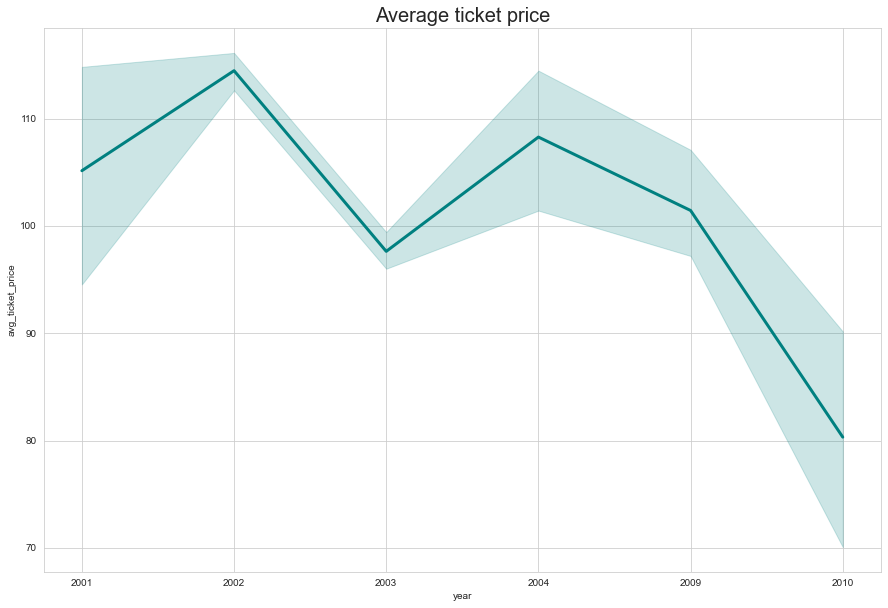

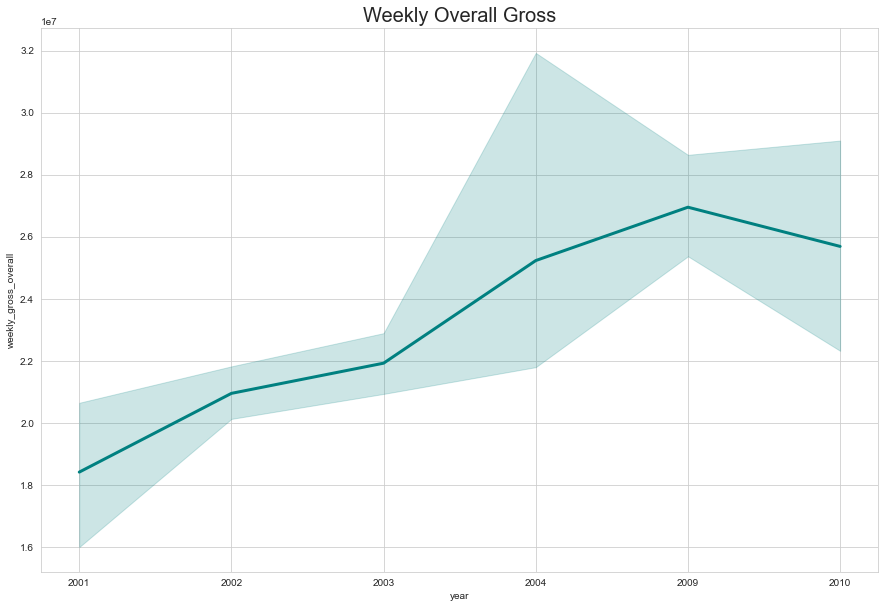

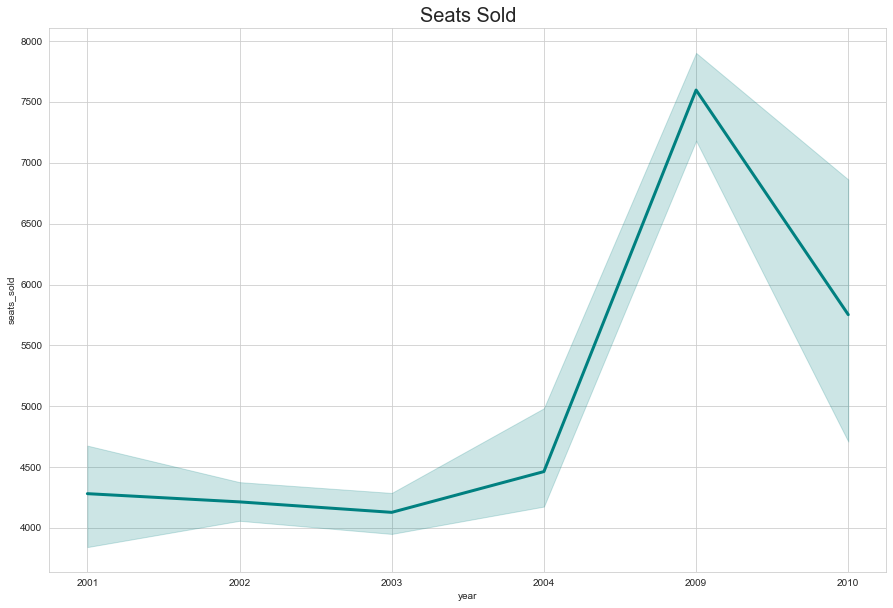

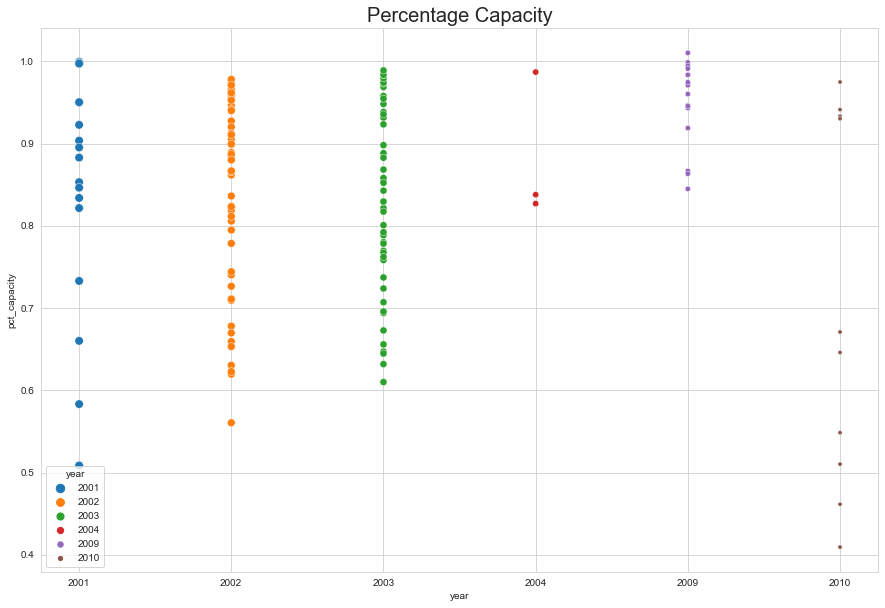

['Hilton Theatre']
The shows performed here ['Chitty Chitty Bang Bang' 'Hot Feet'
 "Dr. Seuss' How the Grinch Stole Christmas!" 'The Pirate Queen'
 'Young Frankenstein']


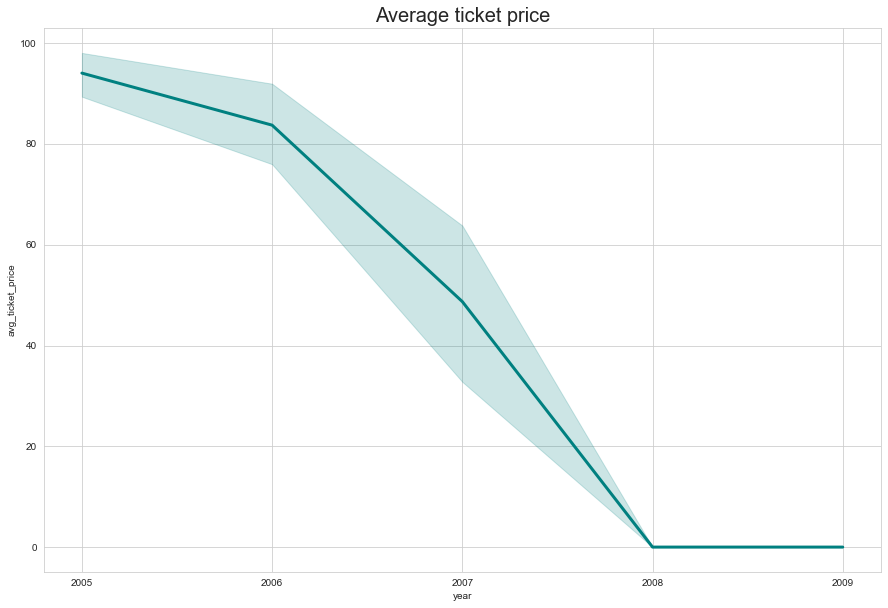

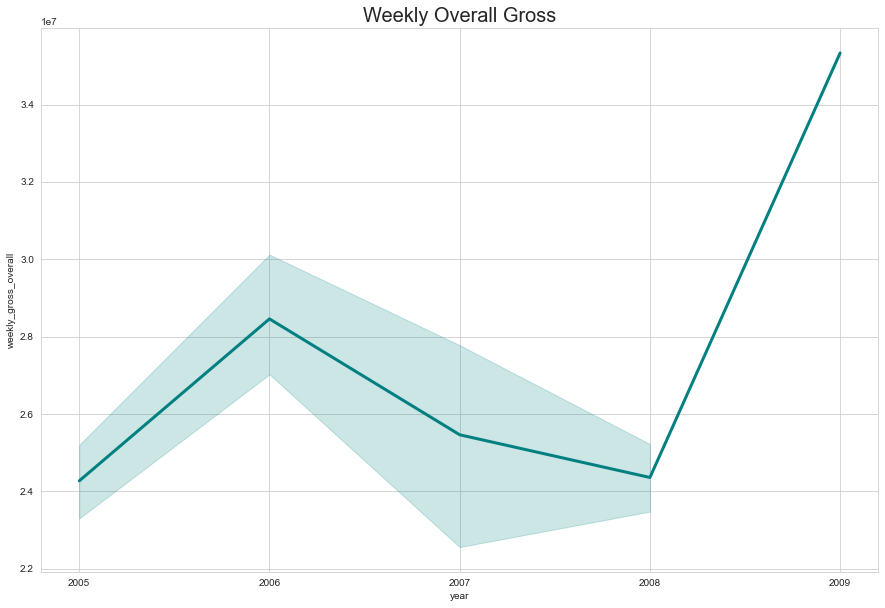

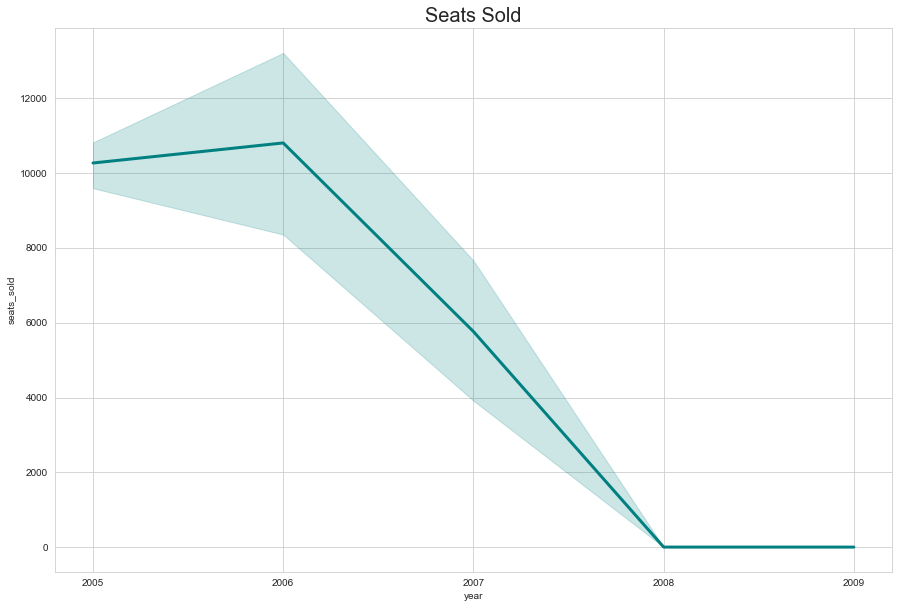

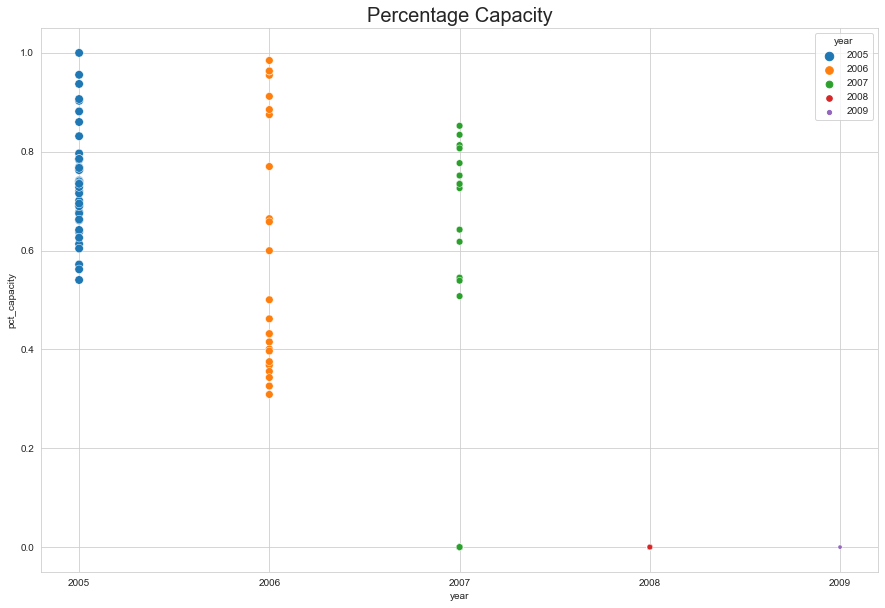

['Hudson Theatre']
The shows performed here ['Sunday in the Park with George' '1984' 'The Parisian Woman'
 'Head Over Heels' 'Burn This' 'Sea Wall/A Life'
 "David Byrne's American Utopia"]


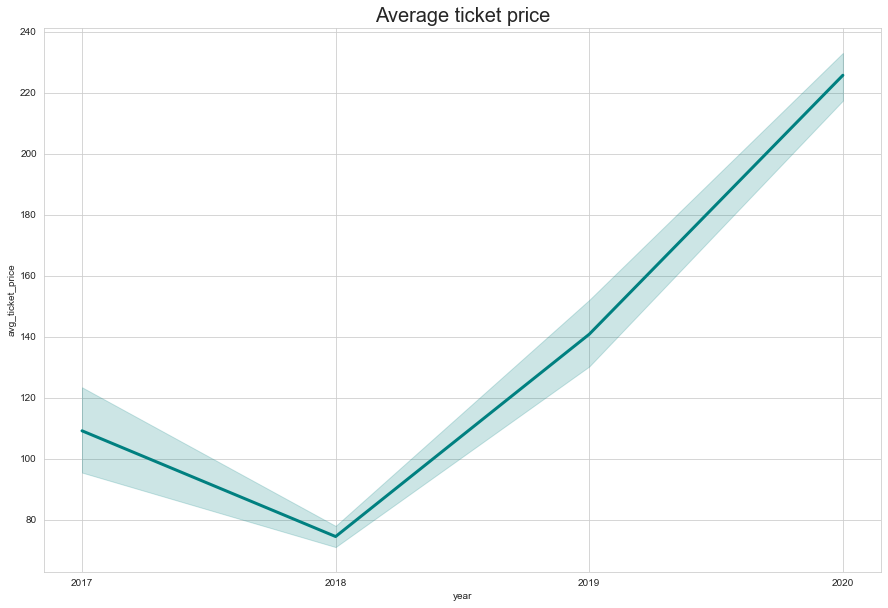

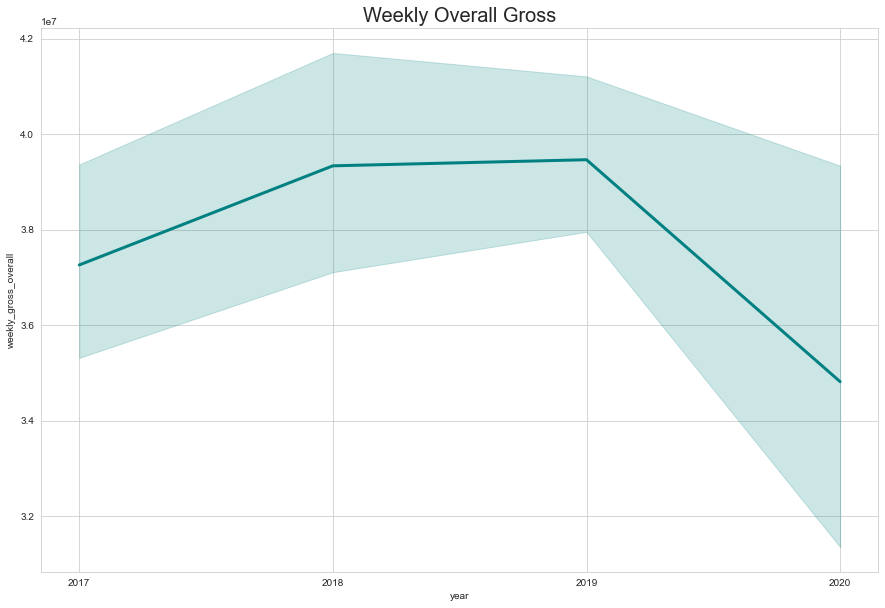

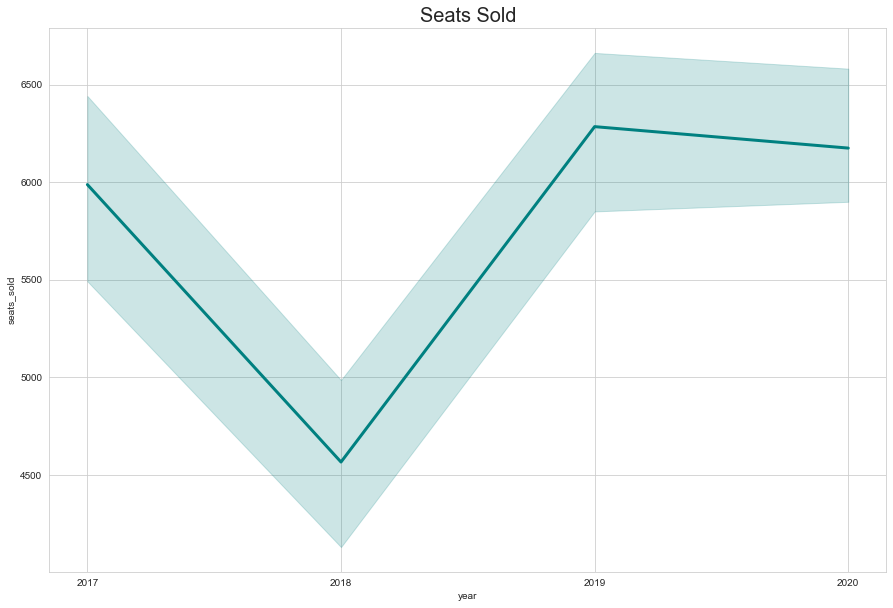

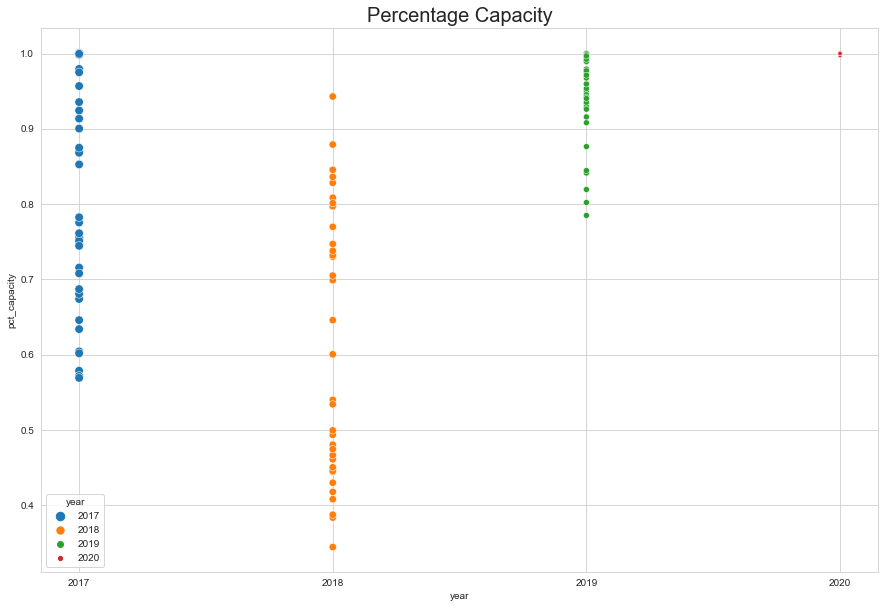

['Helen Hayes Theater']
The shows performed here ['Lobby Hero' 'Straight White Men' 'Torch Song'
 'What the Constitution Means to Me' 'Linda Vista' 'Grand Horizons']


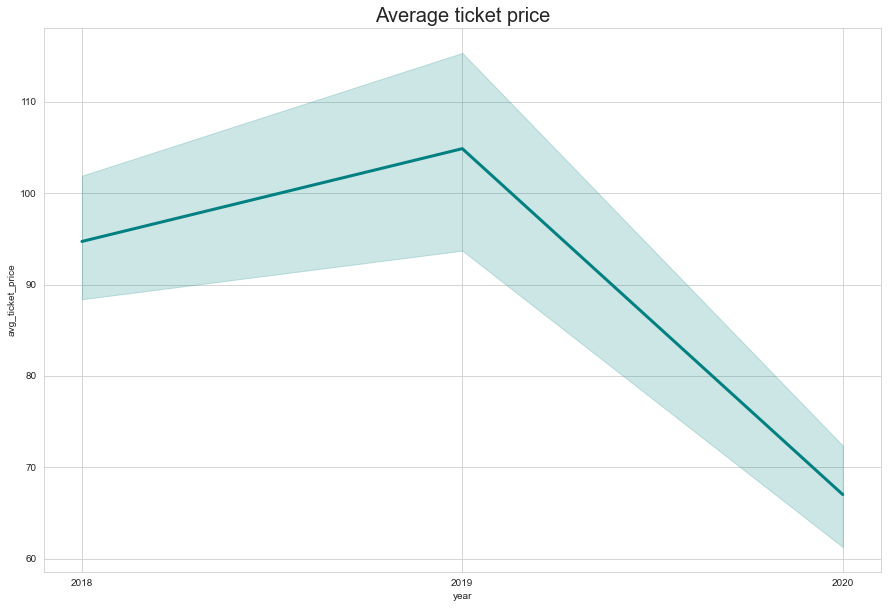

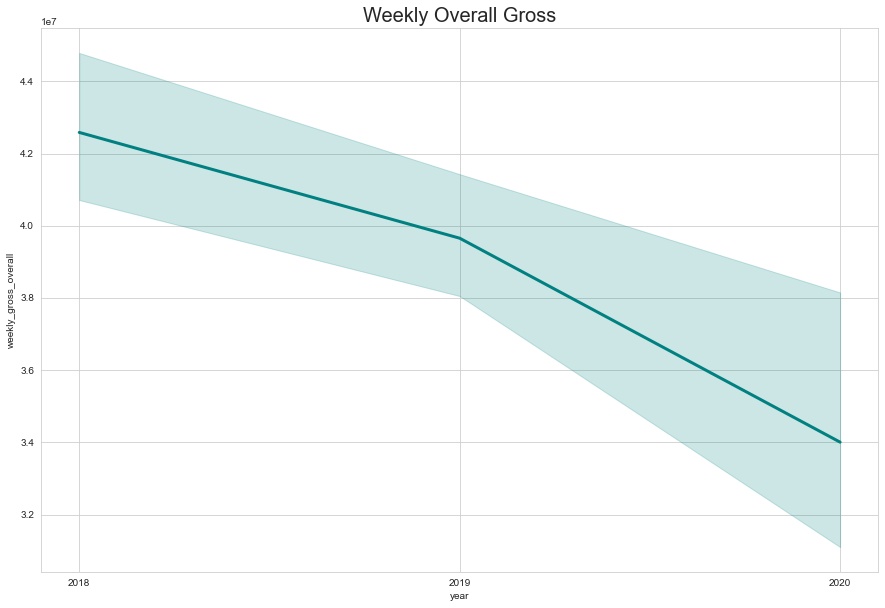

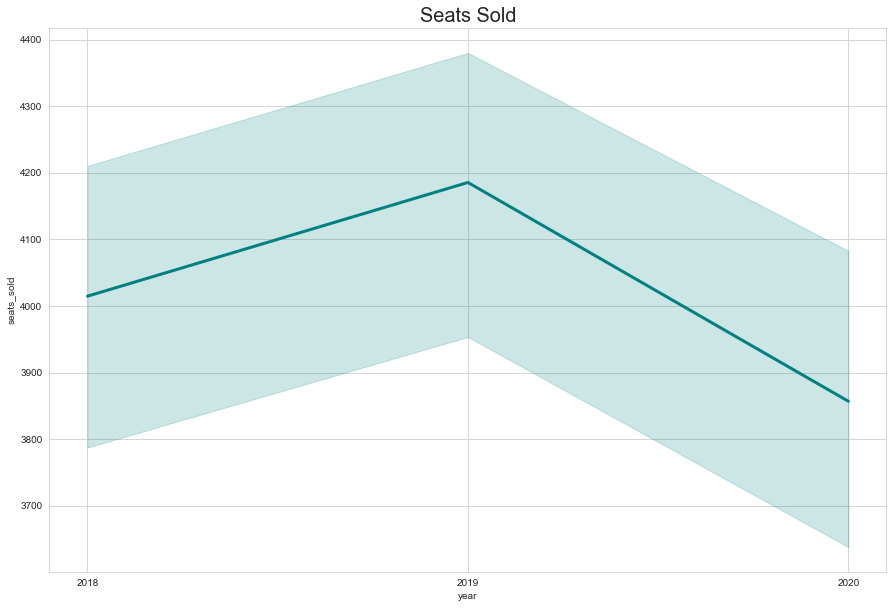

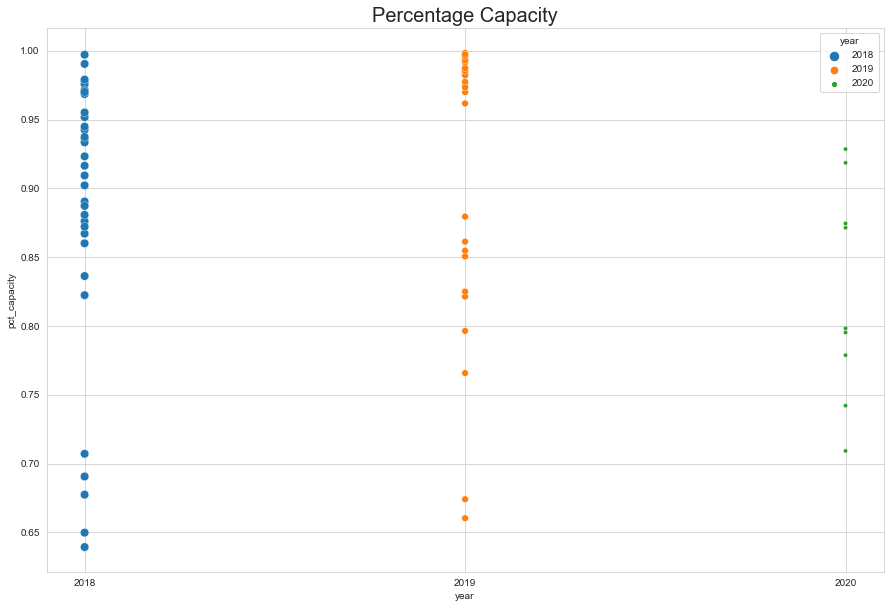

['Ritz Theatre']
The shows performed here ['Doubles' 'Jerome Kern Goes to Hollywood' 'A Month of Sundays'
 'Late Nite Comic' 'Penn & Teller' 'Chu Chem']


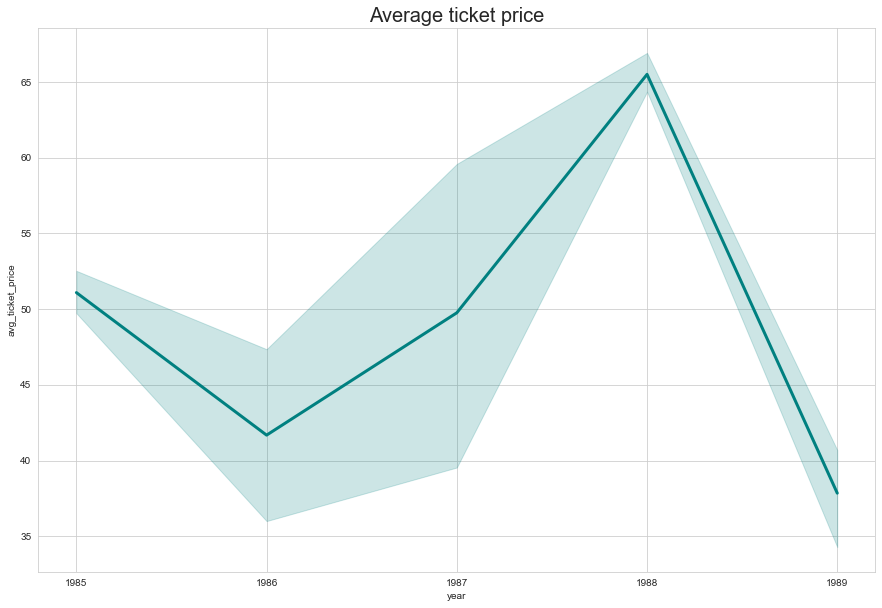

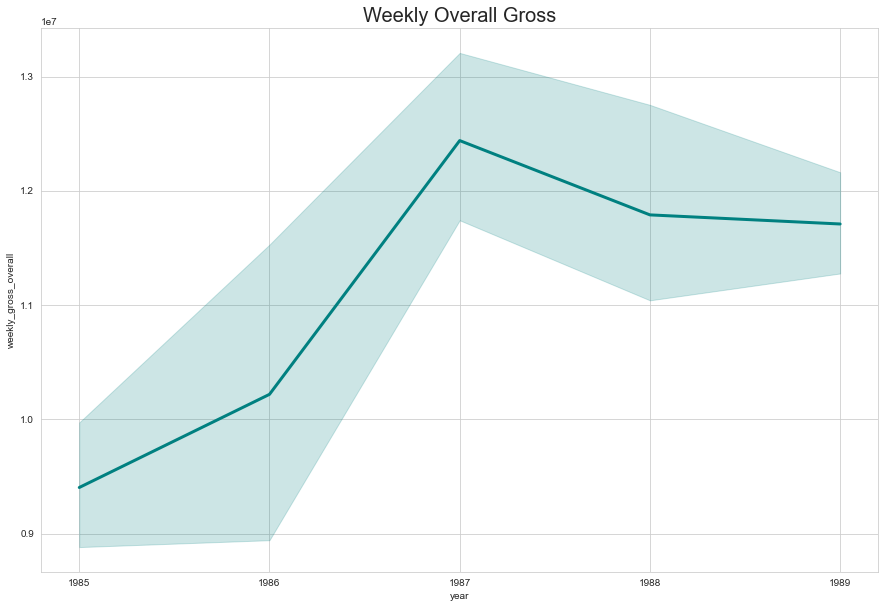

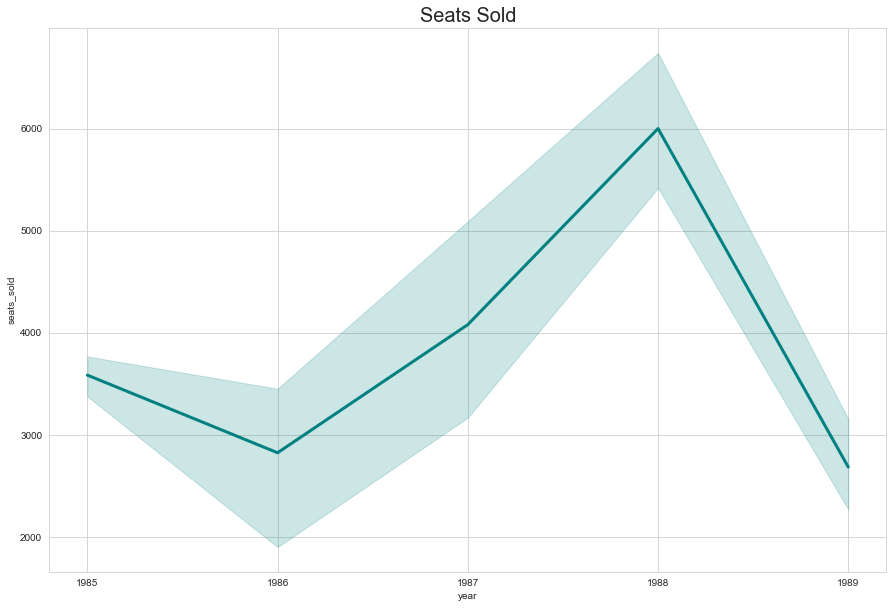

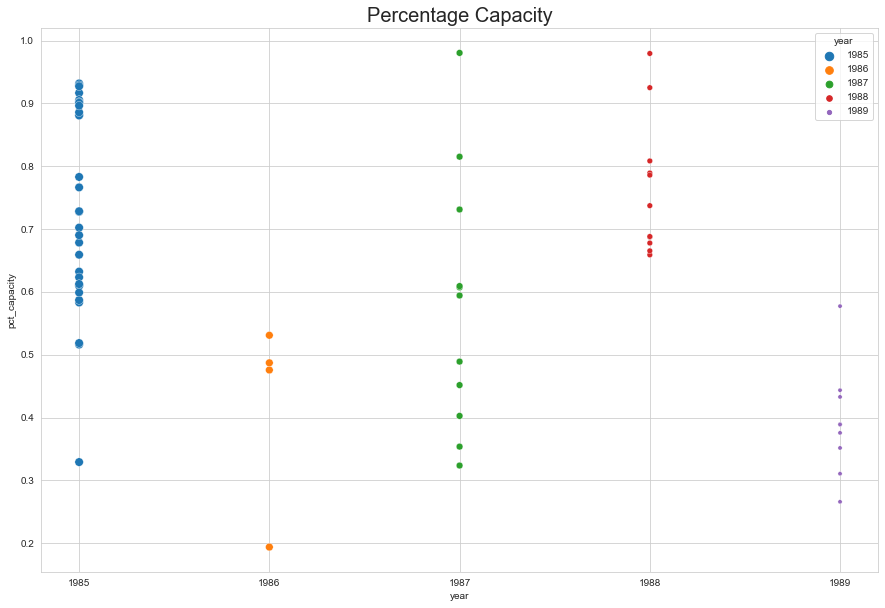

['Mark Hellinger Theatre']
The shows performed here ['Grind' 'Tango Argentino' 'Rags' 'Flamenco Puro' 'Legs Diamond']


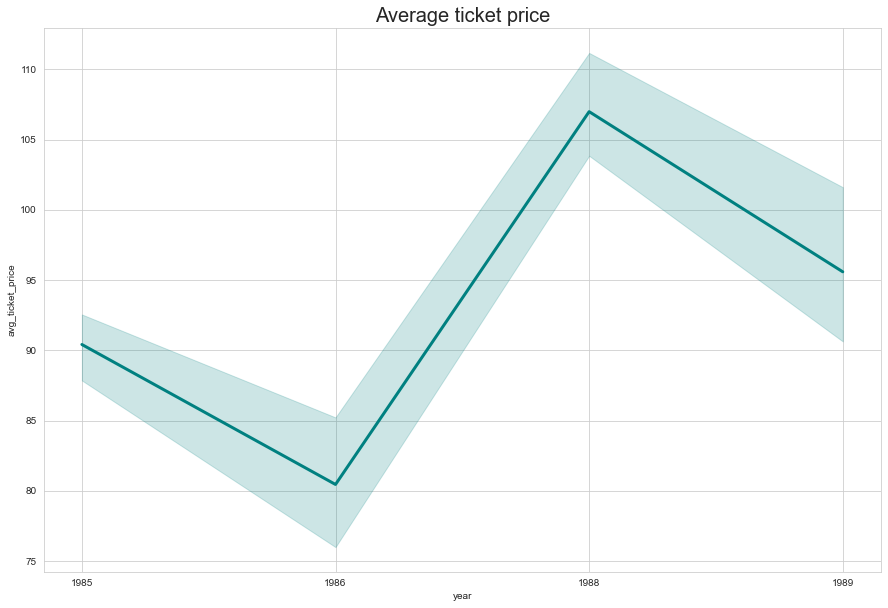

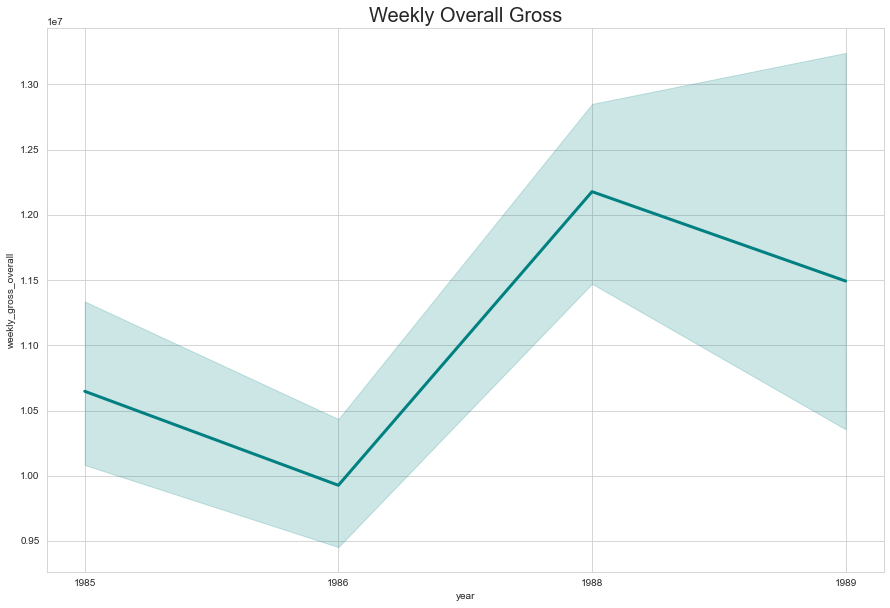

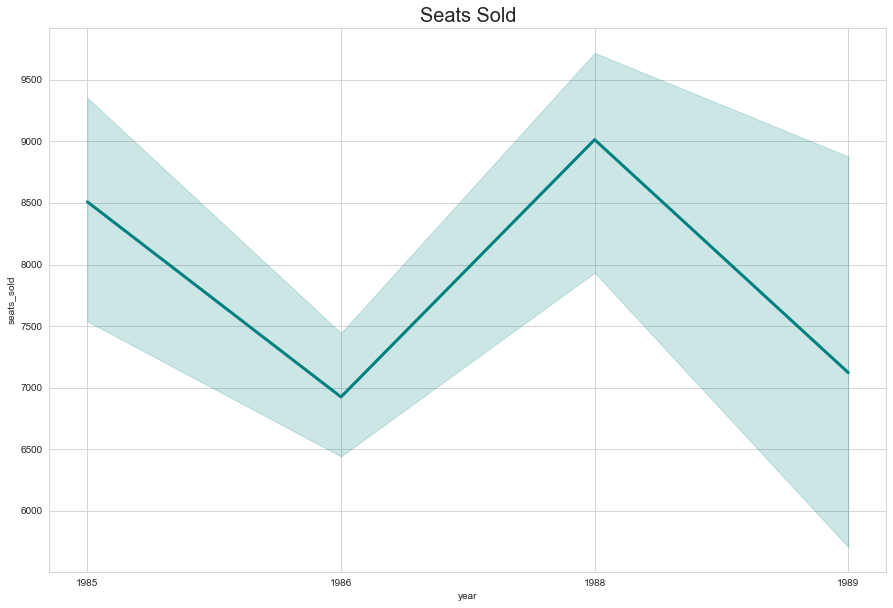

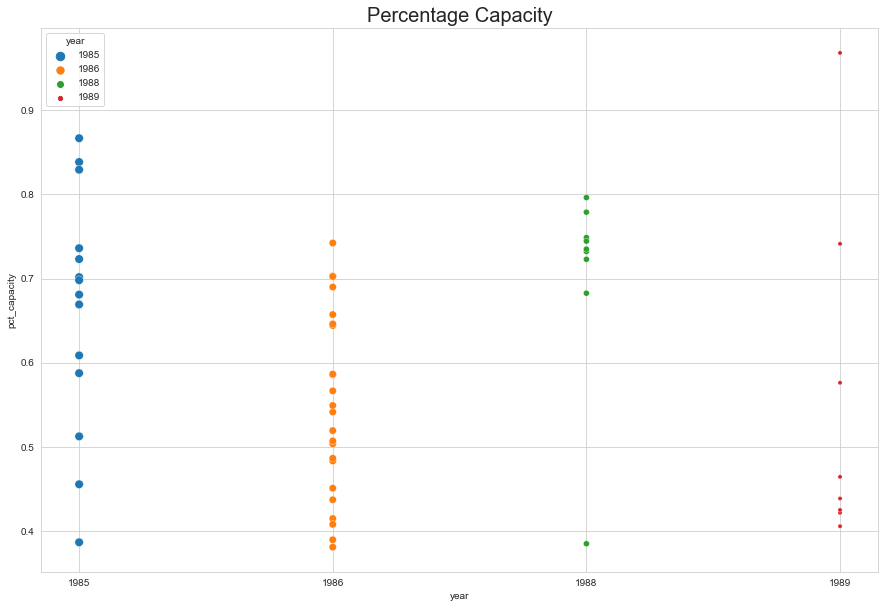

['Jack Lawrence Theatre']
The shows performed here ['So Long on Lonely Street' 'Asinamali!']


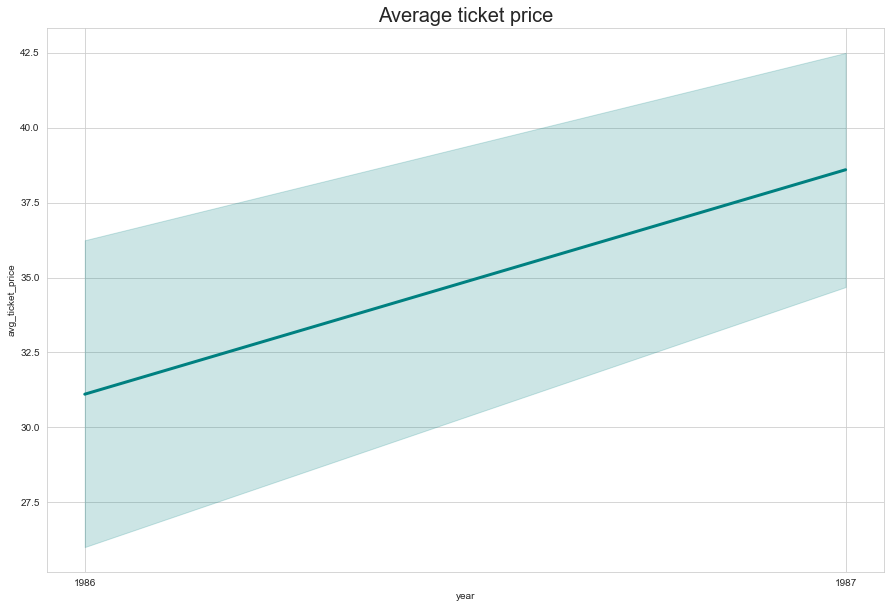

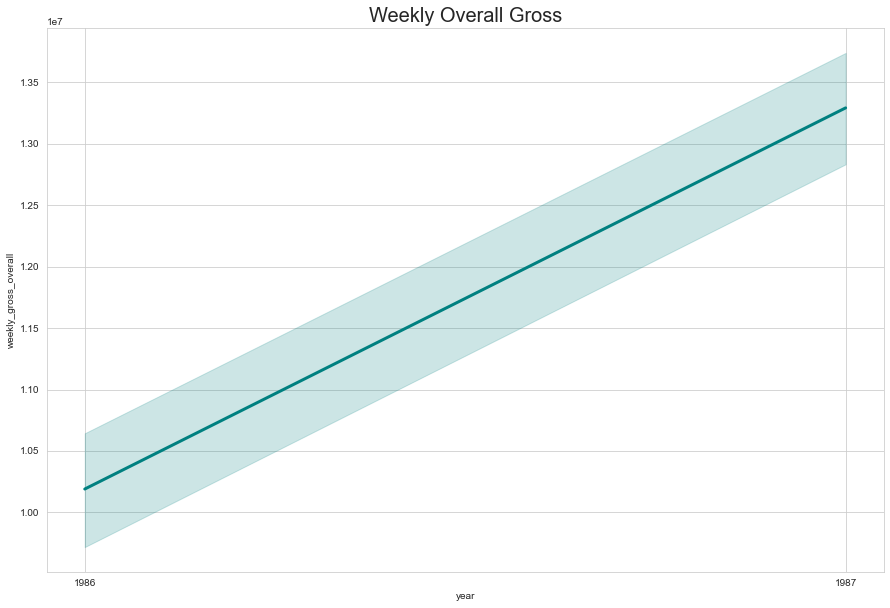

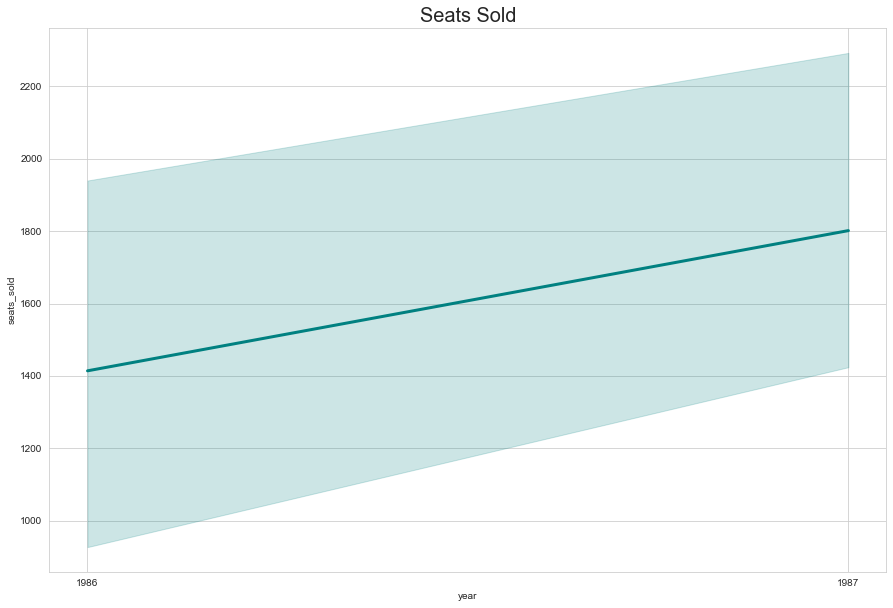

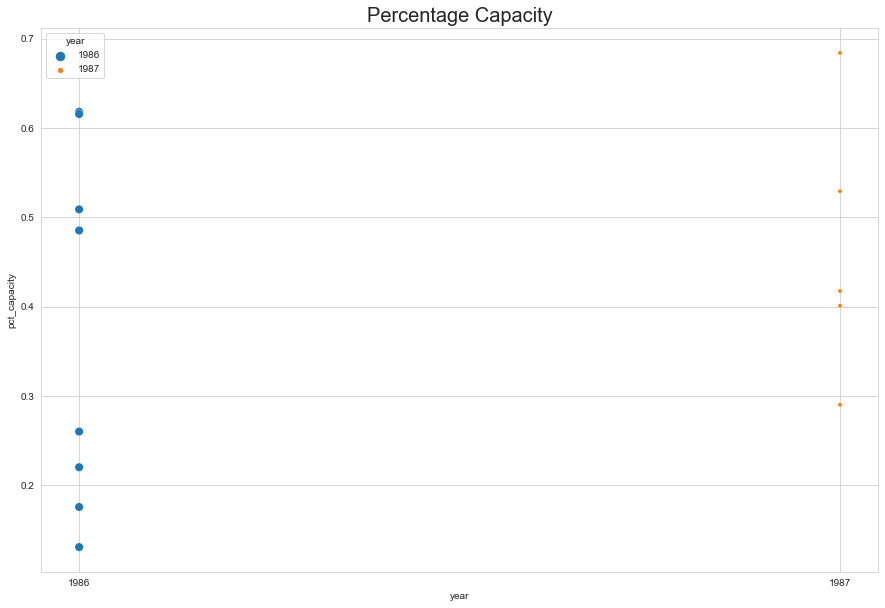

In [61]:
## Understanding the nature of the theatres contributing less than 1% to the broadway industry 
for i in range(0,17):
    print(val[i].theatre.unique())
    print('The shows performed here',val[i].show.unique())
    plt.figure(1)
    sns.lineplot(x=val[i].year,y=val[i].avg_ticket_price,color="teal",linewidth="3")
    plt.title('Average ticket price',fontsize=20)
    plt.figure(2)
    sns.lineplot(x=val[i].year,y=val[i].weekly_gross_overall,color="teal",linewidth="3")
    plt.title('Weekly Overall Gross',fontsize=20)
    plt.figure(3)
    sns.lineplot(x=val[i].year,y=val[i].seats_sold,color="teal",linewidth="3")
    plt.title('Seats Sold',fontsize=20)
    plt.figure(4)
    sns.scatterplot(data=val[i],x='year',y='pct_capacity',hue='year',size='year')
    plt.title('Percentage Capacity',fontsize=20)
    plt.show()
